# DATA-602 Final Project - Injury Severity Prediction in Montgomery County

## Project Overview:
The goal of this project is to predict the injury severity of incidents in Montgomery County. Leveraging a dataset for training and testing models, we aim to build predictive models that can assist in understanding and mitigating the impact of accidents in the county.

## Dataset:
The dataset used for training and testing the models can be accessed below. (https://data.montgomerycountymd.gov/Public-Safety/Crash-Reporting-Drivers-Data/mmzv-x632)

This dataset is a valuable resource containing information about crash reporting and driver data in Montgomery County, providing the necessary input for our injury severity prediction models.



In [1]:
#Importing necessary libraries

from sodapy import Socrata

# Data Manipulation and Visualization
import pandas as pd
import geopandas as gpd
import folium
from folium.plugins import MarkerCluster
import seaborn as sns
import matplotlib.pyplot as plt

# Machine Learning - Preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler

# Machine Learning - Model Selection and Evaluation
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import (
    accuracy_score, classification_report, confusion_matrix,
    roc_auc_score, roc_curve, precision_recall_curve, auc,
)

# XGBoost
import xgboost as xgb
from xgboost import XGBClassifier

# Model Tuning
from sklearn.model_selection import GridSearchCV

# Ensemble Learning
from sklearn.ensemble import VotingClassifier

# Utility
import time
import psutil
import numpy as np

# Weight Calculation
from sklearn.utils.class_weight import compute_sample_weight


In [2]:
#To display all columns in notebook

pd.set_option('display.max_columns',None)

In [3]:
# Connecting to the Socrata API for the specified dataset on "data.montgomerycountymd.gov"

client = Socrata("data.montgomerycountymd.gov", None)
client.timeout = 1000
results = client.get("mmzv-x632", limit=200000)
data = pd.DataFrame.from_records(results)


In [4]:
#To download the datset in csv format. (can be used if client is not working)
#data.to_csv('Crash_ds.csv', index=False)

In [5]:
#Five sample rows of the data.

data.sample(5)

,report_number,local_case_number,agency_name,acrs_report_type,crash_date_time,route_type,road_name,cross_street_type,cross_street_name,municipality,collision_type,weather,surface_condition,light,traffic_control,driver_substance_abuse,person_id,driver_at_fault,injury_severity,circumstance,driver_distracted_by,drivers_license_state,vehicle_id,vehicle_damage_extent,vehicle_first_impact_location,vehicle_second_impact_location,vehicle_body_type,vehicle_movement,vehicle_continuing_dir,vehicle_going_dir,speed_limit,driverless_vehicle,parked_vehicle,vehicle_year,:@computed_region_a9cs_3ed7,:@computed_region_r648_kzwt,vehicle_make,vehicle_model,:@computed_region_vu5j_pcmz,equipment_problems,:@computed_region_tx5f_5em3,:@computed_region_kbsp_ykn9,latitude,:@computed_region_d7bw_bq6x,longitude,:@computed_region_rbt8_3x7n,geolocation,:@computed_region_6vgr_duib,off_road_description,related_non_motorist,non_motorist_substance_abuse
111624,EJ78580017,170537953,Gaithersburg Police Depar,Injury Crash,2017-10-21T08:24:00.000,Maryland (State),QUINCE ORCHARD RD,Municipality,FIRSTFIELD RD,GAITHERSBURG,STRAIGHT MOVEMENT ANGLE,CLEAR,DRY,DAYLIGHT,TRAFFIC SIGNAL,NONE DETECTED,64DFE8B6-753C-4A45-BF51-631FE383F535,No,SUSPECTED MINOR INJURY,N/A,NOT DISTRACTED,MD,5D98BE55-4E9A-40D1-BC90-7BF7937AEC22,DISABLING,ELEVEN OCLOCK,ELEVEN OCLOCK,PASSENGER CAR,MOVING CONSTANT SPEED,East,East,35,No,No,2005,3,5,SATU,TK,3,NO MISUSE,3,36,39.14500833,33,-77.22003,21,"{'latitude': '39.14500833', 'longitude': '-77....",4,NaN,NaN,NaN
157067,DM83400009,15046905,TAKOMA,Property Damage Crash,2015-09-16T13:38:00.000,NaN,NaN,NaN,NaN,NaN,OTHER,N/A,NaN,DAYLIGHT,NO CONTROLS,NONE DETECTED,BFB5964B-A55A-4A03-BC68-1727965D0CB4,No,NO APPARENT INJURY,N/A,NOT DISTRACTED,MD,8220055F-B8C6-4858-A33C-26E4C1BF4043,SUPERFICIAL,SEVEN OCLOCK,SEVEN OCLOCK,POLICE VEHICLE/NON EMERGENCY,BACKING,Unknown,Unknown,15,No,No,2008,5,1,FORD,CROWN VIC,5,NO MISUSE,5,4,38.98896833,3062,-76.98926833,11,"{'latitude': '38.98896833', 'longitude': '-76....",7,Parking lot 1100 blk University Blvd,NaN,NaN
52642,MCP137800VL,200046598,Montgomery County Police,Injury Crash,2020-11-25T16:01:00.000,Municipality,CHRISTOPHER AVE,Maryland (State),FREDERICK RD,N/A,SAME DIR REAR END,CLOUDY,DRY,DAYLIGHT,YIELD SIGN,NONE DETECTED,01AB18DC-2DBE-48F2-B3B8-E8A4211986D3,No,POSSIBLE INJURY,N/A,NOT DISTRACTED,MD,6AFE1A69-0763-4C17-A01B-DD9A3DE20565,FUNCTIONAL,SIX OCLOCK,SIX OCLOCK,PASSENGER CAR,SLOWING OR STOPPING,North,South,30,No,No,2005,3,5,TOYOTA,CAMRY,3,NO MISUSE,3,36,39.156035,31,-77.21616,21,"{'latitude': '39.156035', 'longitude': '-77.21...",4,NaN,NaN,NaN
62558,DD5636001P,200007511,Rockville Police Departme,Injury Crash,2020-02-14T11:34:00.000,Maryland (State),HUNGERFORD DR,Municipality,BEALL AVE #2,ROCKVILLE,SAME DIR REAR END,N/A,DRY,DAYLIGHT,TRAFFIC SIGNAL,NONE DETECTED,D4975ED5-C3CB-4290-B42F-3407AF566BCB,No,POSSIBLE INJURY,N/A,NOT DISTRACTED,MD,DA970DFE-4CB1-4575-AA0D-3B0DFFBA381D,DISABLING,SIX OCLOCK,SIX OCLOCK,PASSENGER CAR,STOPPED IN TRAFFIC LANE,North,North,0,No,No,2004,3,3,TOYT,TK,3,N/A,3,25,39.08733038,71,-77.14987627,12,"{'latitude': '39.08733038', 'longitude': '-77....",4,NaN,NaN,NaN
22353,MCP3296001D,220043128,Montgomery County Police,Property Damage Crash,2022-10-03T17:03:00.000,Ramp,RAMP 5 FR RAMP 8 (US29SB) TO RANDOLPH RD,Maryland (State),E RANDOLPH RD,N/A,SAME DIR BOTH LEFT TURN,RAINING,WET,DAYLIGHT,TRAFFIC SIGNAL,NONE DETECTED,0131FEBC-C8AB-434B-8586-F1BC77A0FAB8,No,NO APPARENT INJURY,"RAIN, SNOW, WET",NOT DISTRACTED,MD,B2B7EC18-0129-45FE-BAA1-498D0F719897,FUNCTIONAL,TEN OCLOCK,TEN OCLOCK,SCHOOL BUS,MAKING LEFT TURN,East,South,30,No,No,2021,5,2,THOMAS,MSDE-D-12,5,NO MISUSE,5,53,39.06266302,12,-76.96279215,1,"{'latitude': '39.06266302', 'longitude': '-76....",1,NaN,NaN,NaN


In [6]:
#Data backup 

df_backup=data.copy()

# Data Analysis


In [7]:
#No. of Rows and columns in the dataset.
data.shape

(170604, 51)

In [8]:
# checking Null Values
data.isna().sum()

report_number                          0
local_case_number                      0
agency_name                            0
acrs_report_type                       0
crash_date_time                        0
route_type                         16839
road_name                          15814
cross_street_type                  16872
cross_street_name                  15814
municipality                       15814
collision_type                         0
weather                                0
surface_condition                  15812
light                                  0
traffic_control                        0
driver_substance_abuse                 0
person_id                              0
driver_at_fault                        0
injury_severity                        0
circumstance                           0
driver_distracted_by                   0
drivers_license_state               9837
vehicle_id                             0
vehicle_damage_extent                  0
vehicle_first_im

In [9]:
#Basic information about the dataset
print("Dataset Information:")
print(data.info())

Dataset Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170604 entries, 0 to 170603
Data columns (total 51 columns):
 #   Column                          Non-Null Count   Dtype 
---  ------                          --------------   ----- 
 0   report_number                   170604 non-null  object
 1   local_case_number               170604 non-null  object
 2   agency_name                     170604 non-null  object
 3   acrs_report_type                170604 non-null  object
 4   crash_date_time                 170604 non-null  object
 5   route_type                      153765 non-null  object
 6   road_name                       154790 non-null  object
 7   cross_street_type               153732 non-null  object
 8   cross_street_name               154790 non-null  object
 9   municipality                    154790 non-null  object
 10  collision_type                  170604 non-null  object
 11  weather                         170604 non-null  object
 12  surface_c

**Converting crash_date_time column to datetime datatype and then extracting new features from this.**

In [10]:
#converting crash_date_time column to datetime datatype and then extracting new features from this.
data['crash_date_time'] = pd.to_datetime(data['crash_date_time'])
data['year']=data['crash_date_time'].dt.year
data['day_of_week'] = data['crash_date_time'].dt.dayofweek
data['month'] = data['crash_date_time'].dt.month
data['hour'] = data['crash_date_time'].dt.hour


**Convert columns to numeric if it has all numeric values**

In [11]:
import pandas as pd
columns_to_convert = []
for column in data.columns:
    if pd.to_numeric(data[column], errors='coerce').notna().all():
        columns_to_convert.append(column)
data[columns_to_convert] = data[columns_to_convert].apply(pd.to_numeric, errors='coerce')

**TARGET VARIABLE**

In [12]:
data['injury_severity'].value_counts()

injury_severity
NO APPARENT INJURY          139933
POSSIBLE INJURY              17326
SUSPECTED MINOR INJURY       11787
SUSPECTED SERIOUS INJURY      1405
FATAL INJURY                   153
Name: count, dtype: int64

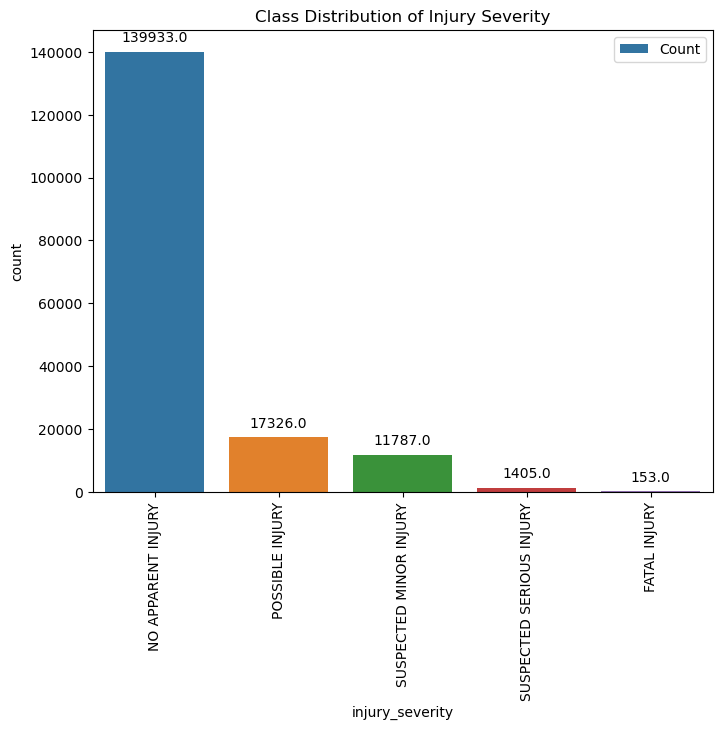

In [13]:
plt.figure(figsize=(8, 6))
ax = sns.countplot(x='injury_severity', data=data)
plt.title('Class Distribution of Injury Severity')
plt.xticks(rotation=90)  

for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 10), textcoords='offset points')

# Add legend
plt.legend(['Count'])
plt.show()

**Above graph shows us that our dataset is clearly an imbalanced dataset**

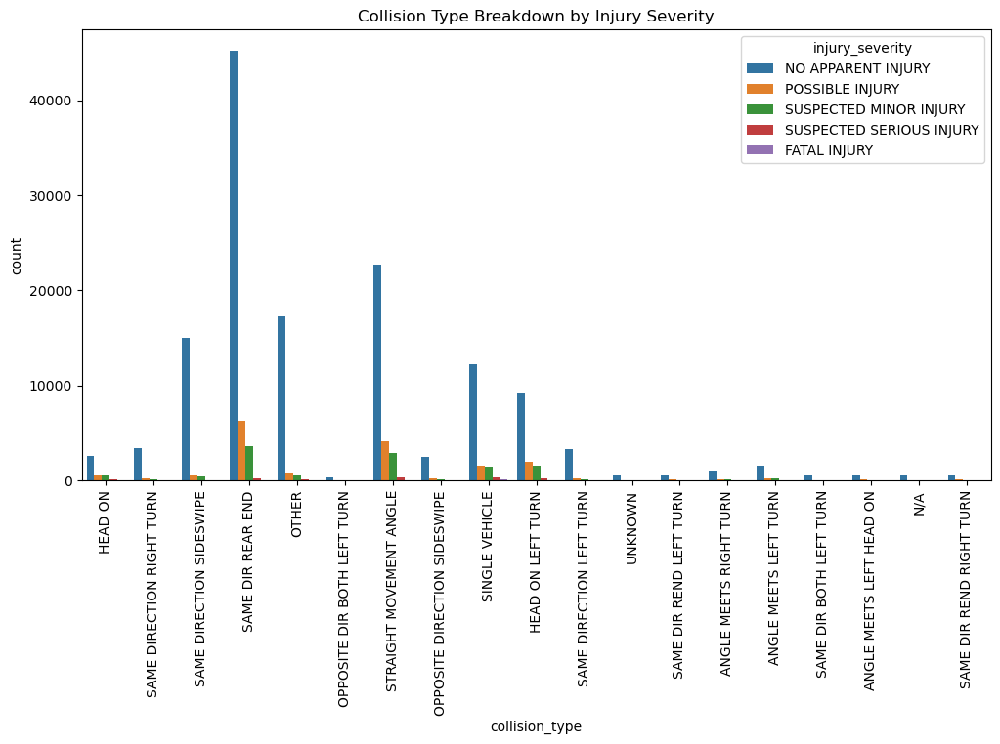

In [14]:
plt.figure(figsize=(12, 6))
sns.countplot(x='collision_type', hue='injury_severity', data=data)
plt.title('Collision Type Breakdown by Injury Severity')
plt.xticks(rotation=90)  
plt.show()


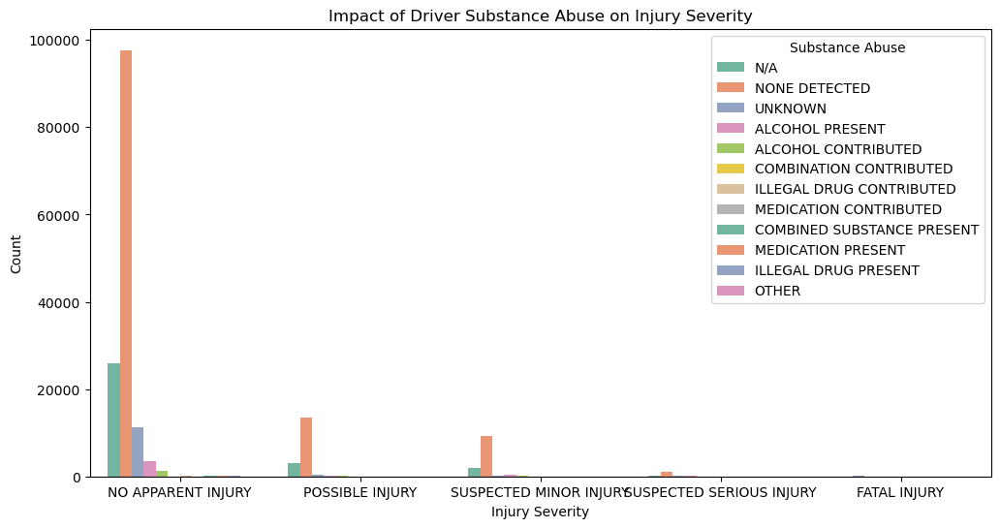

In [15]:
plt.figure(figsize=(12, 6))
sns.countplot(x='injury_severity', hue='driver_substance_abuse', data=data, palette='Set2')
plt.title('Impact of Driver Substance Abuse on Injury Severity')
plt.xticks(rotation=0) 
plt.xlabel('Injury Severity')
plt.ylabel('Count')
plt.legend(title='Substance Abuse', loc='upper right')
plt.show()


<Figure size 1200x600 with 0 Axes>

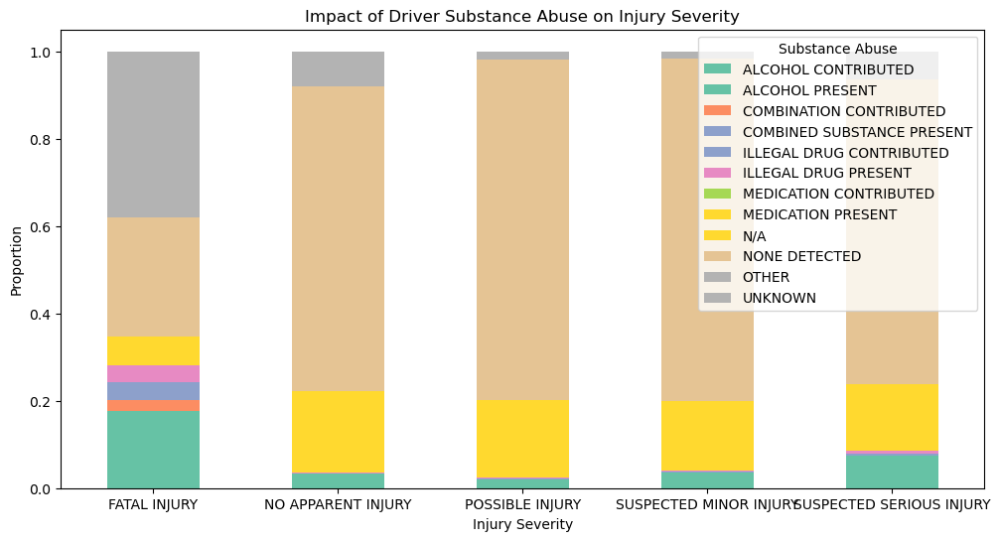

In [16]:
plt.figure(figsize=(12, 6))

proportions = data.groupby(['injury_severity', 'driver_substance_abuse']).size().unstack('driver_substance_abuse').apply(lambda x: x / x.sum(), axis=1)

proportions.plot(kind='bar', stacked=True, cmap='Set2', figsize=(12, 6))

plt.title('Impact of Driver Substance Abuse on Injury Severity')
plt.xlabel('Injury Severity')
plt.ylabel('Proportion')
plt.legend(title='Substance Abuse', loc='upper right')
plt.xticks(rotation=0)
plt.show()


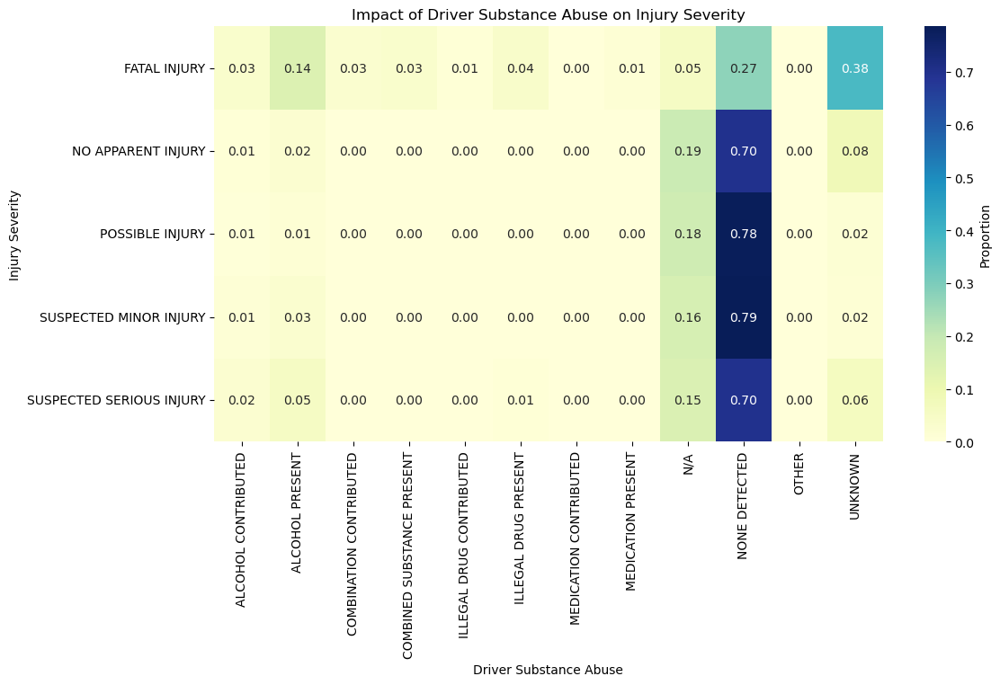

In [17]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

# Create a cross-tabulation of the two categorical variables
cross_tab = pd.crosstab(data['injury_severity'], data['driver_substance_abuse'], normalize='index')

# Plot the heatmap
sns.heatmap(cross_tab, annot=True, cmap='YlGnBu', cbar_kws={'label': 'Proportion'}, fmt='.2f')

plt.title('Impact of Driver Substance Abuse on Injury Severity')
plt.xlabel('Driver Substance Abuse')
plt.ylabel('Injury Severity')
plt.show()


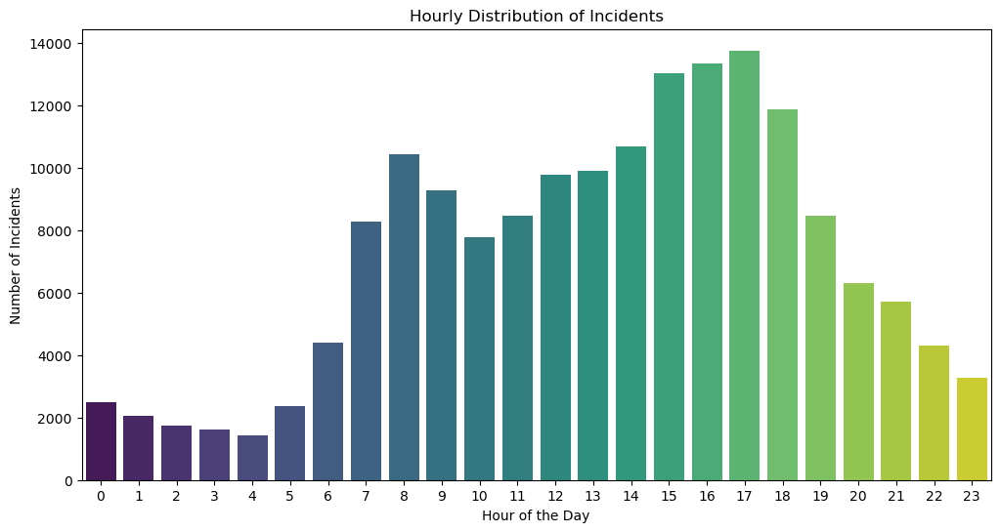

In [18]:
plt.figure(figsize=(12, 6))
sns.countplot(x='hour', data=data, palette='viridis')
plt.title('Hourly Distribution of Incidents')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Incidents')
plt.show()

<Figure size 1200x600 with 0 Axes>

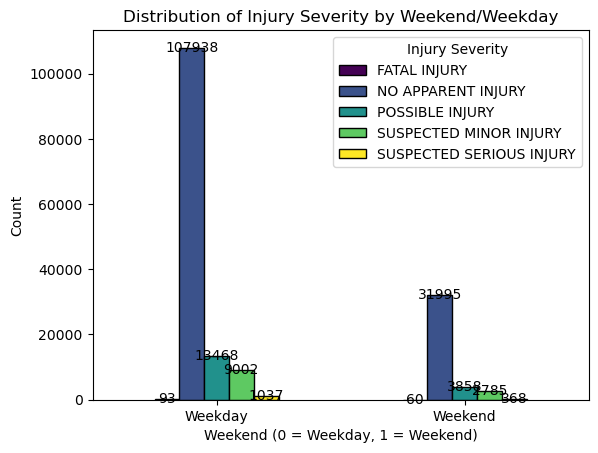

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt

# Creating a new column 'weekend' where 0-4 are weekdays and 5-6 are weekends
data['weekend'] = data['day_of_week'].isin([5, 6])

severity_counts = data.groupby(['weekend', 'injury_severity']).size().unstack('injury_severity')

plt.figure(figsize=(12, 6))

ax = severity_counts.plot(kind='bar', colormap='viridis', edgecolor='black')

for col in severity_counts.columns:
    for i, p in enumerate(ax.patches):
        width, height = p.get_width(), p.get_height()
        x, y = p.get_xy()
        if i % len(severity_counts.columns) == list(severity_counts.columns).index(col):
            ax.annotate(f'{int(height)}', (x + width / 2, y + height + 50), ha='center', va='center', color='black', fontsize=10)

plt.title('Distribution of Injury Severity by Weekend/Weekday')
plt.xlabel('Weekend (0 = Weekday, 1 = Weekend)')
plt.ylabel('Count')
plt.legend(title='Injury Severity', loc='upper right')
plt.xticks([0, 1], ['Weekday', 'Weekend'], rotation=0)
plt.show()


We can see there are more accidents happened on weekday than weekend and most of the accidents resulted to no apparent injury.

# Data Cleaning

In [20]:
data

,report_number,local_case_number,agency_name,acrs_report_type,crash_date_time,route_type,road_name,cross_street_type,cross_street_name,municipality,collision_type,weather,surface_condition,light,traffic_control,driver_substance_abuse,person_id,driver_at_fault,injury_severity,circumstance,driver_distracted_by,drivers_license_state,vehicle_id,vehicle_damage_extent,vehicle_first_impact_location,vehicle_second_impact_location,vehicle_body_type,vehicle_movement,vehicle_continuing_dir,vehicle_going_dir,speed_limit,driverless_vehicle,parked_vehicle,vehicle_year,:@computed_region_a9cs_3ed7,:@computed_region_r648_kzwt,vehicle_make,vehicle_model,:@computed_region_vu5j_pcmz,equipment_problems,:@computed_region_tx5f_5em3,:@computed_region_kbsp_ykn9,latitude,:@computed_region_d7bw_bq6x,longitude,:@computed_region_rbt8_3x7n,geolocation,:@computed_region_6vgr_duib,off_road_description,related_non_motorist,non_motorist_substance_abuse,year,day_of_week,month,hour,weekend
0,MCP2850002Q,230070299,Montgomery County Police,Property Damage Crash,1701899640000000000,County,GOSHEN RD,Maryland (State),MIDCOUNTY HWY,N/A,HEAD ON,CLEAR,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,N/A,8033AA05-95AC-4BB5-9522-432930D2D38F,Yes,NO APPARENT INJURY,N/A,TALKING OR LISTENING TO CELLULAR PHONE,MD,66C48EB3-4864-41B1-B4BE-C91FB10BC222,DESTROYED,TWELVE OCLOCK,TWELVE OCLOCK,PASSENGER CAR,ACCELERATING,North,South,50,No,No,2018,2,5,HOND,4S,2,NO MISUSE,2,36,39.158013,35,-77.192055,1,"{'latitude': '39.15801333', 'longitude': '-77....",3,NaN,NaN,NaN,2023,2,12,21,False
1,MCP2850002Q,230070299,Montgomery County Police,Property Damage Crash,1701899640000000000,County,GOSHEN RD,Maryland (State),MIDCOUNTY HWY,N/A,HEAD ON,CLEAR,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,N/A,209D3ACD-1995-42DC-917A-4BC3B984417B,No,NO APPARENT INJURY,N/A,NOT DISTRACTED,MD,FE937E17-A803-41A8-914A-0A24AA2008C5,DESTROYED,TWELVE OCLOCK,TWELVE OCLOCK,PASSENGER CAR,ACCELERATING,North,North,50,No,No,2015,2,5,HOND,SD,2,NO MISUSE,2,36,39.158013,35,-77.192055,1,"{'latitude': '39.15801333', 'longitude': '-77....",3,NaN,NaN,NaN,2023,2,12,21,False
2,MCP32630044,230070281,Montgomery County Police,Property Damage Crash,1701889500000000000,County,COMMERCE LA,Maryland (State),WISCONSIN AVE,N/A,SAME DIRECTION RIGHT TURN,CLEAR,DRY,N/A,NO CONTROLS,NONE DETECTED,AA44313D-645C-44E3-943F-1A532098EAF1,Yes,NO APPARENT INJURY,N/A,LOOKED BUT DID NOT SEE,MD,37D28D1A-BEFF-43D8-9AA3-9075F3107EB4,SUPERFICIAL,THREE OCLOCK,THREE OCLOCK,PASSENGER CAR,MAKING RIGHT TURN,West,South,25,No,No,2022,1,3,NFLY,548,1,NO MISUSE,1,12,38.985911,111,-77.094933,1,"{'latitude': '38.98591127', 'longitude': '-77....",6,NaN,NaN,NaN,2023,2,12,19,False
3,MCP3197003V,230070260,Montgomery County Police,Property Damage Crash,1701885180000000000,County,BEL PRE RD,Maryland (State),LAYHILL RD,N/A,SAME DIRECTION SIDESWIPE,CLEAR,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,NONE DETECTED,1B5BFF16-7668-40C3-9B7D-ECBF14E2E8C8,No,NO APPARENT INJURY,N/A,NOT DISTRACTED,MD,C5ADFE06-1E25-4135-8F3B-27715D2F0714,FUNCTIONAL,ELEVEN OCLOCK,ELEVEN OCLOCK,PASSENGER CAR,MAKING RIGHT TURN,South,East,35,No,No,2017,4,4,FORD,ESCAPE,4,NO MISUSE,4,59,39.090122,6,-77.044890,1,"{'latitude': '39.09012167', 'longitude': '-77....",2,NaN,NaN,NaN,2023,2,12,17,False
4,MCP3197003V,230070260,Montgomery County Police,Property Damage Crash,1701885180000000000,County,BEL PRE RD,Maryland (State),LAYHILL RD,N/A,SAME DIRECTION SIDESWIPE,CLEAR,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,NONE DETECTED,57B25966-9624-4BAF-8FA5-E1338DD3C93F,Yes,NO APPARENT INJURY,N/A,LOOKED BUT DID NOT SEE,MD,718DBD97-F39D-4DBB-92D6-F2C3350394F0,FUNCTIONAL,TWO OCLOCK,TWO OCLOCK,PASSENGER CAR,MAKING LEFT TURN,South,West,35,No,No,2018,4,4,BMW,330I,4,NO MISUSE,4,59,39.090122,6,-77.044890,1,"{'latitude': '39.09012167', 'longitude': '-77....",2,NaN,NaN,NaN,2023,2,12,17,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

In [21]:
columns_to_drop=[":@computed_region_a9cs_3ed7",':@computed_region_r648_kzwt',
       ':@computed_region_vu5j_pcmz',
       ':@computed_region_tx5f_5em3',':@computed_region_kbsp_ykn9',':@computed_region_d7bw_bq6x',':@computed_region_rbt8_3x7n', 'person_id',
        'crash_date_time',':@computed_region_6vgr_duib','geolocation','related_non_motorist','non_motorist_substance_abuse','off_road_description','report_number', 'local_case_number', 'agency_name','circumstance','driver_distracted_by','drivers_license_state','vehicle_id','vehicle_continuing_dir','vehicle_going_dir','driverless_vehicle','parked_vehicle','vehicle_model','equipment_problems','route_type','road_name','cross_street_type','cross_street_name','municipality']

In [22]:
data=data.drop(columns=columns_to_drop)

# Checking association between features and target

In [23]:

from scipy.stats import chi2_contingency

contingency_table = pd.crosstab(index=data['vehicle_movement'], columns=data['injury_severity'], margins=True)
chi2_stat, p_value, _, _ = chi2_contingency(contingency_table)
print(f"Chi-squared: {chi2_stat}")
print(f"P-value: {p_value}")

if p_value < 0.05:
    print("There is a significant association between vehicle movement and injury severity.")
else:
    print("There is no significant association between vehicle movement and injury severity.")


Chi-squared: 4225.151668035816
P-value: 0.0
There is a significant association between vehicle movement and injury severity.


injury_severity          SUSPECTED SERIOUS INJURY  FATAL INJURY
vehicle_movement                                               
ACCELERATING                             0.931373      0.068627
BACKING                                  1.000000           NaN
CHANGING LANES                           0.880000      0.120000
ENTERING TRAFFIC LANE                    0.857143      0.142857
LEAVING TRAFFIC LANE                     0.777778      0.222222
MAKING LEFT TURN                         0.870748      0.129252
MAKING RIGHT TURN                        0.952381      0.047619
MAKING U TURN                            0.800000      0.200000
MOVING CONSTANT SPEED                    0.919478      0.080522
N/A                                      0.750000      0.250000
NEGOTIATING A CURVE                      0.666667      0.333333
OTHER                                    0.933333      0.066667
PARKED                                   1.000000           NaN
PARKING                                 

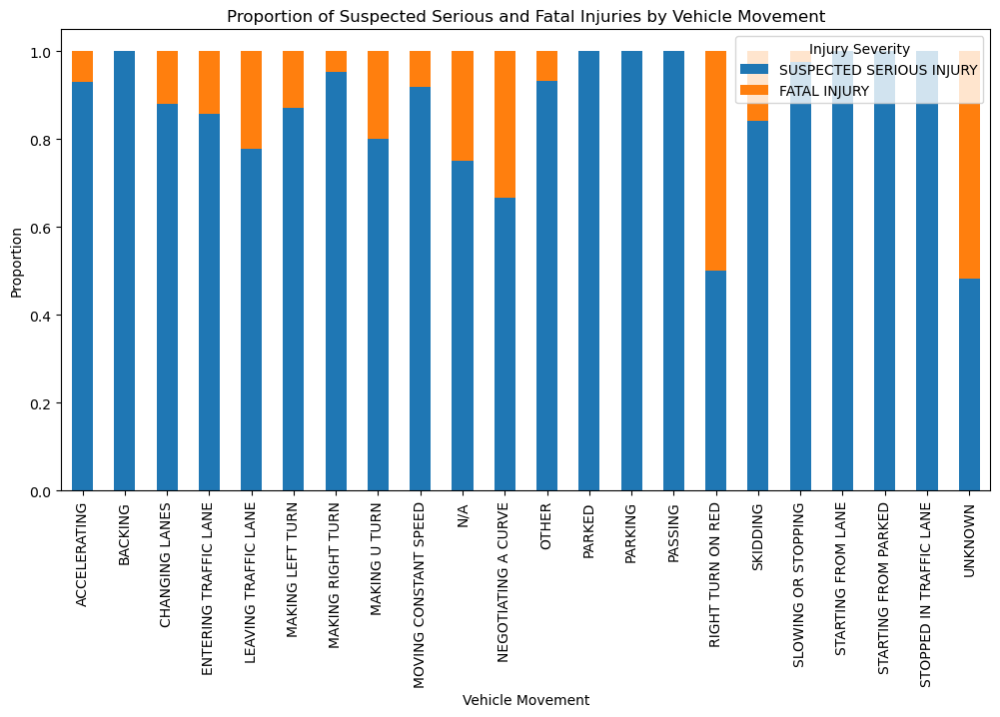

In [24]:
import pandas as pd
import matplotlib.pyplot as plt
data_subset = data[data['injury_severity'].isin(['SUSPECTED SERIOUS INJURY', 'FATAL INJURY'])]

proportions = data_subset.groupby('vehicle_movement')['injury_severity'].value_counts(normalize=True).unstack()

severities_to_analyze = ['SUSPECTED SERIOUS INJURY', 'FATAL INJURY']

proportions_selected = proportions[severities_to_analyze]

print(proportions_selected)

proportions_selected.plot(kind='bar', stacked=True, figsize=(12, 6))
plt.title("Proportion of Suspected Serious and Fatal Injuries by Vehicle Movement")
plt.xlabel("Vehicle Movement")
plt.ylabel("Proportion")
plt.legend(title="Injury Severity", loc='upper right')
plt.show()


In [25]:
#checking if first impact location or second impact location has impact on injury severity
#we use below function alot to find association
def cramers_v(confusion_matrix):
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))

In [26]:
from scipy.stats import chi2_contingency

contingency_table = pd.crosstab(data['vehicle_first_impact_location'], data['injury_severity'])

chi2, p, _, _ = chi2_contingency(contingency_table)

print(f"Chi-squared: {chi2}")
print(f"P-value: {p}")


Chi-squared: 2615.507890200283
P-value: 0.0


In [27]:
cramers_v_value = cramers_v(contingency_table.values)

print(f"Cramér's V: {cramers_v_value}")

Cramér's V: 0.0612234401075984


**This suggests us that there is no strong association between first impact location and injury severity. Let's try combining both first and second impact location**

In [28]:

contingency_table = pd.crosstab(index=data['vehicle_first_impact_location'],
                                columns=[data['vehicle_second_impact_location'], data['injury_severity']],
                                margins=True)

chi2_stat, p_value, _, _ = chi2_contingency(contingency_table)

print(f"Chi-squared: {chi2_stat}")
print(f"P-value: {p_value}")


cramers_v_value = cramers_v(contingency_table.values)
print(f"Cramér's V: {cramers_v_value}")


Chi-squared: 2079794.2573999772
P-value: 0.0
Cramér's V: 0.43665398805759215


In [29]:
data['vehicle_first_impact_location'].fillna(data['vehicle_first_impact_location'].mode()[0], inplace=True)
data['vehicle_second_impact_location'].fillna(data['vehicle_second_impact_location'].mode()[0], inplace=True)

In [30]:
data['combined_impact_locations'] = data['vehicle_first_impact_location'] + '_' + data['vehicle_second_impact_location']


In [31]:
data.drop(['vehicle_first_impact_location', 'vehicle_second_impact_location'], axis=1, inplace=True)


**Association b/w vehicle make and injury severity**

In [32]:
data

,acrs_report_type,collision_type,weather,surface_condition,light,traffic_control,driver_substance_abuse,driver_at_fault,injury_severity,vehicle_damage_extent,vehicle_body_type,vehicle_movement,speed_limit,vehicle_year,vehicle_make,latitude,longitude,year,day_of_week,month,hour,weekend,combined_impact_locations
0,Property Damage Crash,HEAD ON,CLEAR,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,N/A,Yes,NO APPARENT INJURY,DESTROYED,PASSENGER CAR,ACCELERATING,50,2018,HOND,39.158013,-77.192055,2023,2,12,21,False,TWELVE OCLOCK_TWELVE OCLOCK
1,Property Damage Crash,HEAD ON,CLEAR,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,N/A,No,NO APPARENT INJURY,DESTROYED,PASSENGER CAR,ACCELERATING,50,2015,HOND,39.158013,-77.192055,2023,2,12,21,False,TWELVE OCLOCK_TWELVE OCLOCK
2,Property Damage Crash,SAME DIRECTION RIGHT TURN,CLEAR,DRY,N/A,NO CONTROLS,NONE DETECTED,Yes,NO APPARENT INJURY,SUPERFICIAL,PASSENGER CAR,MAKING RIGHT TURN,25,2022,NFLY,38.985911,-77.094933,2023,2,12,19,False,THREE OCLOCK_THREE OCLOCK
3,Property Damage Crash,SAME DIRECTION SIDESWIPE,CLEAR,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,NONE DETECTED,No,NO APPARENT INJURY,FUNCTIONAL,PASSENGER CAR,MAKING RIGHT TURN,35,2017,FORD,39.090122,-77.044890,2023,2,12,17,False,ELEVEN OCLOCK_ELEVEN OCLOCK
4,Property Damage Crash,SAME DIRECTION SIDESWIPE,CLEAR,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,NONE DETECTED,Yes,NO APPARENT INJURY,FUNCTIONAL,PASSENGER CAR,MAKING LEFT TURN,35,2018,BMW,39.090122,-77.044890,2023,2,12,17,False,TWO OCLOCK_TWO OCLOCK
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170599,Injury Crash,HEAD ON,CLEAR,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,N/A,No,SUSPECTED MINOR INJURY,DISABLING,PASSENGER CAR,MOVING CONSTANT SPEED,40,2002,TOYOTA,39.096217,-77.109803,2015,3,1,1,False,TWELVE OCLOCK_TWELVE OCLOCK
170600,Property Damage Crash,SAME DIR REAR END,N/A,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,ALCOHOL PRESENT,Yes,NO APPARENT INJURY,FUNCTIONAL,PASSENGER CAR,SLOWING OR STOPPING,40,2010,FORD,39.196610,-77.265547,2015,3,1,1,False,TWELVE OCLOCK_TWELVE OCLOCK
170601,Property Damage Crash,SAME DIR REAR END,N/A,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,NONE DETECTED,No,NO APPARENT INJURY,FUNCTIONAL,(SPORT) UTILITY VEHICLE,MAKING LEFT TURN,40,2007,JEEP,39.196610,-77.265547,2015,3,1,1,False,SIX OCLOCK_SIX OCLOCK
170602,Property Damage Crash,SAME DIR REAR END,CLEAR,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,ALCOHOL CONTRIBUTED,Yes,NO APPARENT INJURY,FUNCTIONAL,(SPORT) UTILITY VEHICLE,SLOWING OR STOPPING,35,2008,RANGE ROVER,39.022001,-77.102673,2015,3,1,0,False,TWELVE OCLOCK_TWELVE OCLOCK


In [33]:
top_vehicle_makes=pd.DataFrame()
injury_severities=data['injury_severity'].unique()
for severity in injury_severities:
    subset=data[data['injury_severity']==severity]
    top_makes=subset['vehicle_make'].value_counts().head(20)
    top_vehicle_makes[severity]=top_makes.index


In [34]:
top_vehicle_makes

,NO APPARENT INJURY,POSSIBLE INJURY,SUSPECTED MINOR INJURY,SUSPECTED SERIOUS INJURY,FATAL INJURY
0,TOYOTA,TOYOTA,TOYOTA,HONDA,HONDA
1,FORD,HONDA,HONDA,TOYOTA,TOYOTA
2,HONDA,FORD,FORD,FORD,SUZUKI
3,TOYT,NISSAN,NISSAN,NISSAN,FORD
4,NISSAN,TOYT,TOYT,TOYT,NISSAN
5,HOND,HOND,HOND,YAMAHA,YAMAHA
6,DODGE,HYUNDAI,HYUNDAI,DODGE,CHEV
7,UNKNOWN,DODGE,DODGE,BMW,BMW
8,CHEVROLET,JEEP,JEEP,CHEVY,CHEVROLET
9,JEEP,LEXUS,CHEVROLET,CHEVROLET,MAZDA


In [35]:
# Replacing duplicates with original names
make_mapping = {
    'TOY': 'TOYOTA',
    'MER': 'MERCEDES BENZ',
    'SUZ': 'ISUZU',
    'NIS': 'NISSAN',
    'HY': 'HYUNDAI',
    'KIA':'KIA','BMW':'BMW','JEE':'JEEP','YA':'YAMAHA','AU':'AUDI',
    'LEX': 'LEXUS',
    'POR': 'PORSCHE',
    'FOR': 'FORD',
    'HON': 'HONDA',
    'MAZ': 'MAZDA',
    'DOD': 'DODGE',
    'CAD': 'CADILLAC',
    'INF': 'INFINITY',
    'LIN': 'LINCOLN',
    'HAR': 'HARLEY DAVIDSON',
    'LAN': 'LAND ROVER',
    'CHE': 'CHEVROLET',
    'SUB': 'SUBARU',
    'CHR': 'CHRYSLER',
    'VOL': 'VOLKSWAGEN',
    'ACU': 'ACURA'
}

data['vehicle_make'] = data['vehicle_make'].apply(lambda x: next((make_mapping[key] for key in make_mapping.keys() if str(x).startswith(key)), 'OTHERS'))


In [36]:
data['vehicle_make'].value_counts()

vehicle_make
TOYOTA             32415
HONDA              24462
OTHERS             24082
FORD               17029
NISSAN             11286
CHEVROLET          10863
HYUNDAI             6314
DODGE               5345
VOLKSWAGEN          4239
MERCEDES BENZ       4152
ACURA               3772
LEXUS               3767
JEEP                3751
BMW                 3278
SUBARU              3276
MAZDA               2886
KIA                 2681
CHRYSLER            1637
AUDI                1379
INFINITY            1255
CADILLAC             950
LINCOLN              591
ISUZU                326
LAND ROVER           270
PORSCHE              255
HARLEY DAVIDSON      192
YAMAHA               151
Name: count, dtype: int64

In [37]:
import pandas as pd
cross_tab = pd.crosstab(data['vehicle_make'], data['injury_severity'])
cross_tab

injury_severity,FATAL INJURY,NO APPARENT INJURY,POSSIBLE INJURY,SUSPECTED MINOR INJURY,SUSPECTED SERIOUS INJURY
vehicle_make,,,,,
ACURA,1,3084,384,283,20
AUDI,4,1158,120,85,12
BMW,5,2684,328,230,31
CADILLAC,3,785,88,60,14
CHEVROLET,12,9129,982,663,77
CHRYSLER,2,1311,196,118,10
DODGE,2,4579,417,310,37
FORD,9,14691,1336,889,104
HARLEY DAVIDSON,5,39,49,69,30


In [38]:
import pandas as pd
from scipy.stats import chi2_contingency
contingency_table = pd.crosstab(data['vehicle_make'], data['injury_severity'])

chi2, p, _, _ = chi2_contingency(contingency_table)
print(f"Chi-squared statistic: {chi2}")
print(f"P-value: {p}")
if p < 0.05:
    print("There is a significant association between 'vehicle_make' and 'injury_severity'.")
else:
    print("There is no significant association between 'vehicle_make' and 'injury_severity'.")


Chi-squared statistic: 5940.426355564587
P-value: 0.0
There is a significant association between 'vehicle_make' and 'injury_severity'.


In [39]:
missing_values = data.isnull().sum()

columns_with_missing = missing_values[missing_values > 0].index
print("Columns with missing values:")
print(columns_with_missing)
print("\nCount of missing values in each column:")
print(missing_values[columns_with_missing])

Columns with missing values:
Index(['surface_condition', 'vehicle_body_type'], dtype='object')

Count of missing values in each column:
surface_condition    15812
vehicle_body_type     2445
dtype: int64


**Checking association between weather and surface_condition**

In [40]:
import pandas as pd
from scipy.stats import chi2_contingency

contingency_table = pd.crosstab(data['weather'], data['surface_condition'])

chi2, p, _, _ = chi2_contingency(contingency_table)

print(f"Chi-Squared Value: {chi2}")
print(f"P-value: {p}")


Chi-Squared Value: 243518.37951542815
P-value: 0.0


In [41]:
df=data.copy()

In [42]:
import pandas as pd
df['weather'] = df['weather'].replace('N/A', 'UNKNOWN')


In [43]:
# Create a mapping between weather conditions and likely surface conditions
weather_surface_mapping = {
    'CLEAR': 'DRY',
    'RAINING': 'WET',
    'CLOUDY': 'WET',
    'N/A': 'UNKNOWN',
    'SNOW': 'SNOW',
    'UNKNOWN': 'UNKNOWN',
    'FOGGY': 'WET',
    'WINTRY MIX': 'WET',
    'OTHER': 'UNKNOWN',
    'SLEET': 'SNOW',
    'SEVERE WINDS': 'WET',
    'BLOWING SNOW': 'SNOW',
    'BLOWING SAND, SOIL, DIRT': 'UNKNOWN'
}

df['surface_condition'] = df['surface_condition'].replace(['N/A', 'UNKNOWN'], pd.NA)
df['surface_condition'] = df['weather'].map(weather_surface_mapping).combine_first(df['surface_condition'])

print("No of NaN values in 'surface_condition' after filling:")
print(df.isnull().sum())


No of NaN values in 'surface_condition' after filling:
acrs_report_type                0
collision_type                  0
weather                         0
surface_condition               0
light                           0
traffic_control                 0
driver_substance_abuse          0
driver_at_fault                 0
injury_severity                 0
vehicle_damage_extent           0
vehicle_body_type            2445
vehicle_movement                0
speed_limit                     0
vehicle_year                    0
vehicle_make                    0
latitude                        0
longitude                       0
year                            0
day_of_week                     0
month                           0
hour                            0
weekend                         0
combined_impact_locations       0
dtype: int64


In [44]:
#dropping since we associated weather and surface_conditions if not removed creates redundancy
df=df.drop(columns=['weather'])

In [45]:
df['vehicle_body_type'].value_counts()

vehicle_body_type
PASSENGER CAR                                                118028
(SPORT) UTILITY VEHICLE                                       15853
PICKUP TRUCK                                                   6739
VAN                                                            4921
TRANSIT BUS                                                    3617
SCHOOL BUS                                                     2935
POLICE VEHICLE/NON EMERGENCY                                   2095
OTHER LIGHT TRUCKS (10,000LBS (4,536KG) OR LESS)               1899
CARGO VAN/LIGHT TRUCK 2 AXLES (OVER 10,000LBS (4,536 KG))      1844
OTHER                                                          1531
POLICE VEHICLE/EMERGENCY                                       1487
MEDIUM/HEAVY TRUCKS 3 AXLES (OVER 10,000LBS (4,536KG))         1463
UNKNOWN                                                        1050
MOTORCYCLE                                                      888
STATION WAGON                 

In [46]:
#creating a new feature which shows size of vehicle either light or heavy.
size_mapping = {
    'PASSENGER CAR': 'Light',
    '(SPORT) UTILITY VEHICLE': 'Heavy',
    'MOTORCYCLE': 'Light',
    'SNOWMOBILE': 'Light',
    'ALL TERRAIN VEHICLE (ATV)': 'Light',
    'AUTOCYCLE': 'Light',
    'LOW SPEED VEHICLE': 'Light',
    'OTHER LIGHT TRUCKS (10,000LBS (4,536KG) OR LESS)': 'Light',
    'CARGO VAN/LIGHT TRUCK 2 AXLES (OVER 10,000LBS (4,536 KG))': 'Light',
    'POLICE VEHICLE/EMERGENCY': 'Light',
    'MEDIUM/HEAVY TRUCKS 3 AXLES (OVER 10,000LBS (4,536KG))': 'Light',
}

df['vehicle_size'] = df['vehicle_body_type'].map(size_mapping).fillna('Heavy')

In [47]:
#creating one more feature which shows whether vehicle is commercial or not
commercial_categories = ['TRANSIT BUS', 'SCHOOL BUS', 'CARGO VAN/LIGHT TRUCK 2 AXLES', '(SPORT) UTILITY VEHICLE']
df['is_commercial_vehicle'] = df['vehicle_body_type'].isin(commercial_categories).astype(int)


In [48]:
df['vehicle_body_type'] = df['vehicle_body_type'].str.replace('(10,000LBS (4,536KG) OR LESS)', '').str.strip()
df['vehicle_body_type'] = df['vehicle_body_type'].str.replace('(OVER 10,000LBS (4,536 KG))', '').str.strip()
df['vehicle_body_type'] = df['vehicle_body_type'].str.replace('(OVER 10,000LBS (4,536KG))', '').str.strip()

In [49]:
#replacing rows with N/A with UNKNOWN. N/A is not same as NaN.
df['light'] = df['light'].replace('N/A', 'UNKNOWN')
df['traffic_control'] = df['traffic_control'].replace('N/A', 'UNKNOWN')
df['driver_substance_abuse'] = df['driver_substance_abuse'].replace('N/A', 'UNKNOWN')
df['vehicle_damage_extent'] = df['vehicle_damage_extent'].replace('N/A', 'UNKNOWN')
df['vehicle_body_type'] = df['vehicle_body_type'].replace('N/A', 'UNKNOWN')
df['vehicle_movement'] = df['vehicle_movement'].replace('N/A', 'UNKNOWN')


In [50]:
df

,acrs_report_type,collision_type,surface_condition,light,traffic_control,driver_substance_abuse,driver_at_fault,injury_severity,vehicle_damage_extent,vehicle_body_type,vehicle_movement,speed_limit,vehicle_year,vehicle_make,latitude,longitude,year,day_of_week,month,hour,weekend,combined_impact_locations,vehicle_size,is_commercial_vehicle
0,Property Damage Crash,HEAD ON,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,UNKNOWN,Yes,NO APPARENT INJURY,DESTROYED,PASSENGER CAR,ACCELERATING,50,2018,HONDA,39.158013,-77.192055,2023,2,12,21,False,TWELVE OCLOCK_TWELVE OCLOCK,Light,0
1,Property Damage Crash,HEAD ON,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,UNKNOWN,No,NO APPARENT INJURY,DESTROYED,PASSENGER CAR,ACCELERATING,50,2015,HONDA,39.158013,-77.192055,2023,2,12,21,False,TWELVE OCLOCK_TWELVE OCLOCK,Light,0
2,Property Damage Crash,SAME DIRECTION RIGHT TURN,DRY,UNKNOWN,NO CONTROLS,NONE DETECTED,Yes,NO APPARENT INJURY,SUPERFICIAL,PASSENGER CAR,MAKING RIGHT TURN,25,2022,OTHERS,38.985911,-77.094933,2023,2,12,19,False,THREE OCLOCK_THREE OCLOCK,Light,0
3,Property Damage Crash,SAME DIRECTION SIDESWIPE,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,NONE DETECTED,No,NO APPARENT INJURY,FUNCTIONAL,PASSENGER CAR,MAKING RIGHT TURN,35,2017,FORD,39.090122,-77.044890,2023,2,12,17,False,ELEVEN OCLOCK_ELEVEN OCLOCK,Light,0
4,Property Damage Crash,SAME DIRECTION SIDESWIPE,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,NONE DETECTED,Yes,NO APPARENT INJURY,FUNCTIONAL,PASSENGER CAR,MAKING LEFT TURN,35,2018,BMW,39.090122,-77.044890,2023,2,12,17,False,TWO OCLOCK_TWO OCLOCK,Light,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170599,Injury Crash,HEAD ON,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,UNKNOWN,No,SUSPECTED MINOR INJURY,DISABLING,PASSENGER CAR,MOVING CONSTANT SPEED,40,2002,TOYOTA,39.096217,-77.109803,2015,3,1,1,False,TWELVE OCLOCK_TWELVE OCLOCK,Light,0
170600,Property Damage Crash,SAME DIR REAR END,UNKNOWN,DARK LIGHTS ON,TRAFFIC SIGNAL,ALCOHOL PRESENT,Yes,NO APPARENT INJURY,FUNCTIONAL,PASSENGER CAR,SLOWING OR STOPPING,40,2010,FORD,39.196610,-77.265547,2015,3,1,1,False,TWELVE OCLOCK_TWELVE OCLOCK,Light,0
170601,Property Damage Crash,SAME DIR REAR END,UNKNOWN,DARK LIGHTS ON,TRAFFIC SIGNAL,NONE DETECTED,No,NO APPARENT INJURY,FUNCTIONAL,(SPORT) UTILITY VEHICLE,MAKING LEFT TURN,40,2007,JEEP,39.196610,-77.265547,2015,3,1,1,False,SIX OCLOCK_SIX OCLOCK,Heavy,1
170602,Property Damage Crash,SAME DIR REAR END,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,ALCOHOL CONTRIBUTED,Yes,NO APPARENT INJURY,FUNCTIONAL,(SPORT) UTILITY VEHICLE,SLOWING OR STOPPING,35,2008,OTHERS,39.022001,-77.102673,2015,3,1,0,False,TWELVE OCLOCK_TWELVE OCLOCK,Heavy,1


In [51]:
df['injury_severity'].value_counts()

injury_severity
NO APPARENT INJURY          139933
POSSIBLE INJURY              17326
SUSPECTED MINOR INJURY       11787
SUSPECTED SERIOUS INJURY      1405
FATAL INJURY                   153
Name: count, dtype: int64

/Users/dikshitha/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/dikshitha/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/dikshitha/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/dikshitha/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` wi

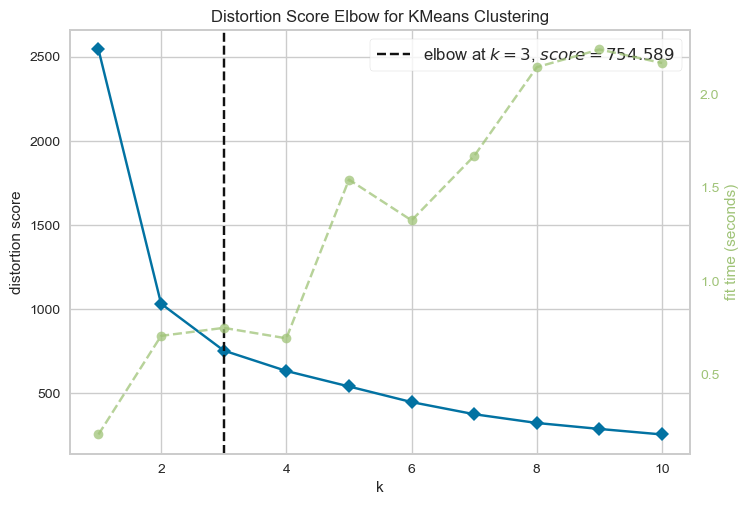

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [52]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
import pandas as pd

X = df[['latitude', 'longitude']]
model = KMeans(random_state=42)

visualizer = KElbowVisualizer(model, k=(1, 11), metric='distortion')
visualizer.fit(X)
visualizer.show()


In [53]:
print(visualizer.elbow_value_)

3


In [87]:
import warnings
warnings.filterwarnings("ignore")

In [55]:
kmeans=KMeans(visualizer.elbow_value_,random_state=42)
df['cluster']=kmeans.fit_predict(X)

In [56]:
df

,acrs_report_type,collision_type,surface_condition,light,traffic_control,driver_substance_abuse,driver_at_fault,injury_severity,vehicle_damage_extent,vehicle_body_type,vehicle_movement,speed_limit,vehicle_year,vehicle_make,latitude,longitude,year,day_of_week,month,hour,weekend,combined_impact_locations,vehicle_size,is_commercial_vehicle,cluster
0,Property Damage Crash,HEAD ON,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,UNKNOWN,Yes,NO APPARENT INJURY,DESTROYED,PASSENGER CAR,ACCELERATING,50,2018,HONDA,39.158013,-77.192055,2023,2,12,21,False,TWELVE OCLOCK_TWELVE OCLOCK,Light,0,1
1,Property Damage Crash,HEAD ON,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,UNKNOWN,No,NO APPARENT INJURY,DESTROYED,PASSENGER CAR,ACCELERATING,50,2015,HONDA,39.158013,-77.192055,2023,2,12,21,False,TWELVE OCLOCK_TWELVE OCLOCK,Light,0,1
2,Property Damage Crash,SAME DIRECTION RIGHT TURN,DRY,UNKNOWN,NO CONTROLS,NONE DETECTED,Yes,NO APPARENT INJURY,SUPERFICIAL,PASSENGER CAR,MAKING RIGHT TURN,25,2022,OTHERS,38.985911,-77.094933,2023,2,12,19,False,THREE OCLOCK_THREE OCLOCK,Light,0,0
3,Property Damage Crash,SAME DIRECTION SIDESWIPE,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,NONE DETECTED,No,NO APPARENT INJURY,FUNCTIONAL,PASSENGER CAR,MAKING RIGHT TURN,35,2017,FORD,39.090122,-77.044890,2023,2,12,17,False,ELEVEN OCLOCK_ELEVEN OCLOCK,Light,0,2
4,Property Damage Crash,SAME DIRECTION SIDESWIPE,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,NONE DETECTED,Yes,NO APPARENT INJURY,FUNCTIONAL,PASSENGER CAR,MAKING LEFT TURN,35,2018,BMW,39.090122,-77.044890,2023,2,12,17,False,TWO OCLOCK_TWO OCLOCK,Light,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170599,Injury Crash,HEAD ON,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,UNKNOWN,No,SUSPECTED MINOR INJURY,DISABLING,PASSENGER CAR,MOVING CONSTANT SPEED,40,2002,TOYOTA,39.096217,-77.109803,2015,3,1,1,False,TWELVE OCLOCK_TWELVE OCLOCK,Light,0,0
170600,Property Damage Crash,SAME DIR REAR END,UNKNOWN,DARK LIGHTS ON,TRAFFIC SIGNAL,ALCOHOL PRESENT,Yes,NO APPARENT INJURY,FUNCTIONAL,PASSENGER CAR,SLOWING OR STOPPING,40,2010,FORD,39.196610,-77.265547,2015,3,1,1,False,TWELVE OCLOCK_TWELVE OCLOCK,Light,0,1
170601,Property Damage Crash,SAME DIR REAR END,UNKNOWN,DARK LIGHTS ON,TRAFFIC SIGNAL,NONE DETECTED,No,NO APPARENT INJURY,FUNCTIONAL,(SPORT) UTILITY VEHICLE,MAKING LEFT TURN,40,2007,JEEP,39.196610,-77.265547,2015,3,1,1,False,SIX OCLOCK_SIX OCLOCK,Heavy,1,1
170602,Property Damage Crash,SAME DIR REAR END,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,ALCOHOL CONTRIBUTED,Yes,NO APPARENT INJURY,FUNCTIONAL,(SPORT) UTILITY VEHICLE,SLOWING OR STOPPING,35,2008,OTHERS,39.022001,-77.102673,2015,3,1,0,False,TWELVE OCLOCK_TWELVE OCLOCK,Heavy,1,0


# REMOVING OUTLIERS
**Considering values between 1990 and 2023**

In [57]:
df = df[(df['vehicle_year'] >= 1970) & (df['vehicle_year'] <= 2023)]

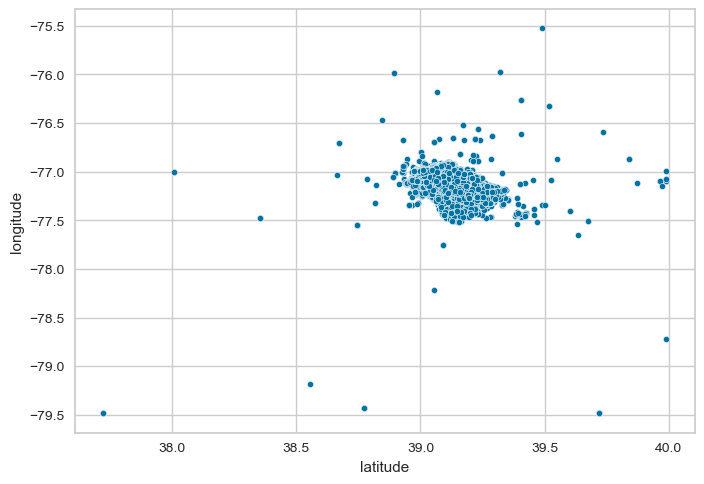

In [58]:
sns.scatterplot(x='latitude', y='longitude', data=df,legend=False, s=20)
plt.show()

In [59]:
#removing outliers using z-score
import numpy as np

latitude_z_scores = np.abs((df['latitude'] - df['latitude'].mean()) / df['latitude'].std())
longitude_z_scores = np.abs((df['longitude'] - df['longitude'].mean()) / df['longitude'].std())
threshold = 3
latitude_outliers = df[latitude_z_scores > threshold]
longitude_outliers = df[longitude_z_scores > threshold]

In [60]:
threshold = 3
df = df[(latitude_z_scores <= threshold) & (longitude_z_scores <= threshold)]

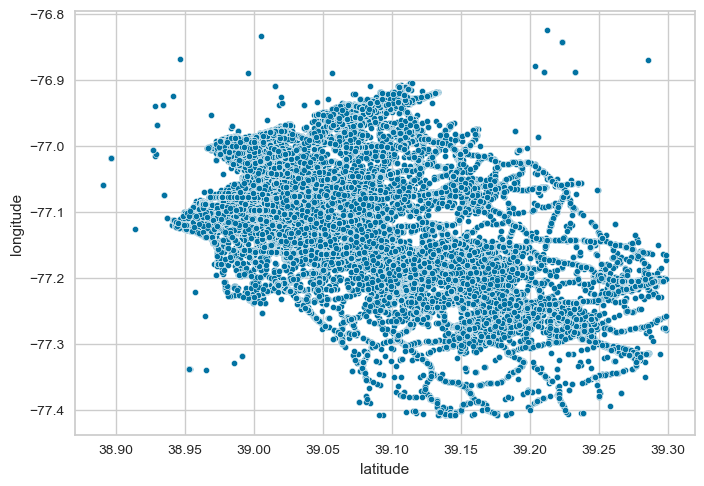

In [61]:
sns.scatterplot(x='latitude', y='longitude', data=df,legend=False, s=20)
plt.show()

In [62]:
import plotly.express as px

mean_latitude = df["latitude"].mean()
mean_longitude = df["longitude"].mean()

# Creating a scatter map using Plotly Express
fig = px.scatter_mapbox(
    df,
    lat="latitude",
    lon="longitude",
    title="Accidents in Montgomery County",
    mapbox_style="carto-positron",
    zoom=10, 
    center=dict(lon=mean_longitude, lat=mean_latitude),  
    size_max=15
)

fig.show()

In [63]:
df['injury_severity'].value_counts()

injury_severity
NO APPARENT INJURY          135074
POSSIBLE INJURY              17139
SUSPECTED MINOR INJURY       11681
SUSPECTED SERIOUS INJURY      1358
FATAL INJURY                   149
Name: count, dtype: int64

**NULL HYPOTHESIS**

All features are associated with target variable.

In [64]:
df.head(1)

,acrs_report_type,collision_type,surface_condition,light,traffic_control,driver_substance_abuse,driver_at_fault,injury_severity,vehicle_damage_extent,vehicle_body_type,vehicle_movement,speed_limit,vehicle_year,vehicle_make,latitude,longitude,year,day_of_week,month,hour,weekend,combined_impact_locations,vehicle_size,is_commercial_vehicle,cluster
0,Property Damage Crash,HEAD ON,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,UNKNOWN,Yes,NO APPARENT INJURY,DESTROYED,PASSENGER CAR,ACCELERATING,50,2018,HONDA,39.158013,-77.192055,2023,2,12,21,False,TWELVE OCLOCK_TWELVE OCLOCK,Light,0,1


In [65]:
import pandas as pd
from scipy.stats import chi2_contingency, f_oneway

categorical_columns = ['combined_impact_locations','acrs_report_type','light', 'traffic_control', 'driver_substance_abuse', 'driver_at_fault',
                        'vehicle_damage_extent', 'vehicle_body_type', 'vehicle_movement','surface_condition','vehicle_make',
                        'collision_type','weekend','vehicle_size']

numerical_columns = ['is_commercial_vehicle','cluster','speed_limit', 'vehicle_year', 'latitude', 'longitude','year','day_of_week', 'month', 'hour']

association_results = []

for column in categorical_columns:
    contingency_table = pd.crosstab(index=df[column], columns=df['injury_severity'])
    chi2_stat, p_value, _, _ = chi2_contingency(contingency_table)
    association_results.append({'Feature': column, 'Test': 'Chi-squared', 'Stat': chi2_stat, 'P-value': p_value})


# ANOVA for numerical variables
for column in numerical_columns:
    groups = [df[df['injury_severity'] == level][column] for level in df['injury_severity'].unique()]
    f_stat, p_value = f_oneway(*groups)
    association_results.append({'Feature': column, 'Test': 'ANOVA', 'Stat': f_stat, 'P-value': p_value})

association_results_df = pd.DataFrame(association_results)

print(association_results_df)


                      Feature         Test           Stat        P-value
0   combined_impact_locations  Chi-squared    6538.200875   0.000000e+00
1            acrs_report_type  Chi-squared  123619.917604   0.000000e+00
2                       light  Chi-squared     220.582737   8.198066e-32
3             traffic_control  Chi-squared     974.933673  1.990368e-178
4      driver_substance_abuse  Chi-squared    1802.979467   0.000000e+00
5             driver_at_fault  Chi-squared    2433.490457   0.000000e+00
6       vehicle_damage_extent  Chi-squared   19049.942867   0.000000e+00
7           vehicle_body_type  Chi-squared    9740.030405   0.000000e+00
8            vehicle_movement  Chi-squared    4005.737301   0.000000e+00
9           surface_condition  Chi-squared      72.479226   1.097687e-10
10               vehicle_make  Chi-squared    5287.829093   0.000000e+00
11             collision_type  Chi-squared    6352.132269   0.000000e+00
12                    weekend  Chi-squared      41.

These results indicate that the mentioned features are associated with the severity of injuries in different ways. Thus we reject Null Hypothesis

In [66]:
df['day_or_night'] = df['hour'].apply(lambda x: 'night' if 0 <= x < 6 or 18 <= x < 24 else 'day')

In [67]:
df['injury_severity'].value_counts()

injury_severity
NO APPARENT INJURY          135074
POSSIBLE INJURY              17139
SUSPECTED MINOR INJURY       11681
SUSPECTED SERIOUS INJURY      1358
FATAL INJURY                   149
Name: count, dtype: int64

**FEATURE ENCODING AND SCALING**

We use One-Hot Encoding for the category columns with no order and when there is an inherent order we use Ordinal Encoding.

We use Label Encoding only for target variable not for input features.

https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.LabelEncoder.html


In [68]:
df_encoded = df.copy()

In [69]:
#Label Encoder
severity_mapping = {
    'NO APPARENT INJURY': 0,
    'POSSIBLE INJURY': 1,
    'SUSPECTED MINOR INJURY': 2,
    'SUSPECTED SERIOUS INJURY': 3,
    'FATAL INJURY': 4
}

df_encoded['injury_severity'] = df_encoded['injury_severity'].map(severity_mapping)


In [70]:
df_encoded['injury_severity'].value_counts()

injury_severity
0    135074
1     17139
2     11681
3      1358
4       149
Name: count, dtype: int64

In [71]:
target_means = df_encoded.groupby('vehicle_make')['injury_severity'].mean()
df_encoded['vehicle_make_encoded'] = df_encoded['vehicle_make'].map(target_means)

In [72]:
df_encoded

,acrs_report_type,collision_type,surface_condition,light,traffic_control,driver_substance_abuse,driver_at_fault,injury_severity,vehicle_damage_extent,vehicle_body_type,vehicle_movement,speed_limit,vehicle_year,vehicle_make,latitude,longitude,year,day_of_week,month,hour,weekend,combined_impact_locations,vehicle_size,is_commercial_vehicle,cluster,day_or_night,vehicle_make_encoded
0,Property Damage Crash,HEAD ON,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,UNKNOWN,Yes,0,DESTROYED,PASSENGER CAR,ACCELERATING,50,2018,HONDA,39.158013,-77.192055,2023,2,12,21,False,TWELVE OCLOCK_TWELVE OCLOCK,Light,0,1,night,0.325304
1,Property Damage Crash,HEAD ON,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,UNKNOWN,No,0,DESTROYED,PASSENGER CAR,ACCELERATING,50,2015,HONDA,39.158013,-77.192055,2023,2,12,21,False,TWELVE OCLOCK_TWELVE OCLOCK,Light,0,1,night,0.325304
2,Property Damage Crash,SAME DIRECTION RIGHT TURN,DRY,UNKNOWN,NO CONTROLS,NONE DETECTED,Yes,0,SUPERFICIAL,PASSENGER CAR,MAKING RIGHT TURN,25,2022,OTHERS,38.985911,-77.094933,2023,2,12,19,False,THREE OCLOCK_THREE OCLOCK,Light,0,0,night,0.169598
3,Property Damage Crash,SAME DIRECTION SIDESWIPE,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,NONE DETECTED,No,0,FUNCTIONAL,PASSENGER CAR,MAKING RIGHT TURN,35,2017,FORD,39.090122,-77.044890,2023,2,12,17,False,ELEVEN OCLOCK_ELEVEN OCLOCK,Light,0,2,day,0.203147
4,Property Damage Crash,SAME DIRECTION SIDESWIPE,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,NONE DETECTED,Yes,0,FUNCTIONAL,PASSENGER CAR,MAKING LEFT TURN,35,2018,BMW,39.090122,-77.044890,2023,2,12,17,False,TWO OCLOCK_TWO OCLOCK,Light,0,2,day,0.274124
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170599,Injury Crash,HEAD ON,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,UNKNOWN,No,2,DISABLING,PASSENGER CAR,MOVING CONSTANT SPEED,40,2002,TOYOTA,39.096217,-77.109803,2015,3,1,1,False,TWELVE OCLOCK_TWELVE OCLOCK,Light,0,0,night,0.306421
170600,Property Damage Crash,SAME DIR REAR END,UNKNOWN,DARK LIGHTS ON,TRAFFIC SIGNAL,ALCOHOL PRESENT,Yes,0,FUNCTIONAL,PASSENGER CAR,SLOWING OR STOPPING,40,2010,FORD,39.196610,-77.265547,2015,3,1,1,False,TWELVE OCLOCK_TWELVE OCLOCK,Light,0,1,night,0.203147
170601,Property Damage Crash,SAME DIR REAR END,UNKNOWN,DARK LIGHTS ON,TRAFFIC SIGNAL,NONE DETECTED,No,0,FUNCTIONAL,(SPORT) UTILITY VEHICLE,MAKING LEFT TURN,40,2007,JEEP,39.196610,-77.265547,2015,3,1,1,False,SIX OCLOCK_SIX OCLOCK,Heavy,1,1,night,0.245273
170602,Property Damage Crash,SAME DIR REAR END,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,ALCOHOL CONTRIBUTED,Yes,0,FUNCTIONAL,(SPORT) UTILITY VEHICLE,SLOWING OR STOPPING,35,2008,OTHERS,39.022001,-77.102673,2015,3,1,0,False,TWELVE OCLOCK_TWELVE OCLOCK,Heavy,1,0,night,0.169598


In [73]:
from sklearn.preprocessing import OrdinalEncoder

damage_extent_order = ['NO DAMAGE', 'SUPERFICIAL', 'FUNCTIONAL', 'DESTROYED', 'DISABLING', 'UNKNOWN', 'OTHER']
size_order = ['Light', 'Heavy']
weekend_order = [False, True]
day_or_night_order = ['day', 'night']

# Columns to be encoded
columns_to_encode = ['vehicle_damage_extent', 'vehicle_size', 'weekend', 'day_or_night']
encoder = OrdinalEncoder(categories=[damage_extent_order, size_order, weekend_order, day_or_night_order])
df_encoded[columns_to_encode] = encoder.fit_transform(df_encoded[columns_to_encode])

In [74]:
df_encoded['vehicle_damage_extent'].value_counts()

vehicle_damage_extent
4.0    61303
2.0    43698
1.0    42743
3.0     7393
0.0     5979
5.0     4184
6.0      101
Name: count, dtype: int64

In [75]:
df_encoded

,acrs_report_type,collision_type,surface_condition,light,traffic_control,driver_substance_abuse,driver_at_fault,injury_severity,vehicle_damage_extent,vehicle_body_type,vehicle_movement,speed_limit,vehicle_year,vehicle_make,latitude,longitude,year,day_of_week,month,hour,weekend,combined_impact_locations,vehicle_size,is_commercial_vehicle,cluster,day_or_night,vehicle_make_encoded
0,Property Damage Crash,HEAD ON,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,UNKNOWN,Yes,0,3.0,PASSENGER CAR,ACCELERATING,50,2018,HONDA,39.158013,-77.192055,2023,2,12,21,0.0,TWELVE OCLOCK_TWELVE OCLOCK,0.0,0,1,1.0,0.325304
1,Property Damage Crash,HEAD ON,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,UNKNOWN,No,0,3.0,PASSENGER CAR,ACCELERATING,50,2015,HONDA,39.158013,-77.192055,2023,2,12,21,0.0,TWELVE OCLOCK_TWELVE OCLOCK,0.0,0,1,1.0,0.325304
2,Property Damage Crash,SAME DIRECTION RIGHT TURN,DRY,UNKNOWN,NO CONTROLS,NONE DETECTED,Yes,0,1.0,PASSENGER CAR,MAKING RIGHT TURN,25,2022,OTHERS,38.985911,-77.094933,2023,2,12,19,0.0,THREE OCLOCK_THREE OCLOCK,0.0,0,0,1.0,0.169598
3,Property Damage Crash,SAME DIRECTION SIDESWIPE,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,NONE DETECTED,No,0,2.0,PASSENGER CAR,MAKING RIGHT TURN,35,2017,FORD,39.090122,-77.044890,2023,2,12,17,0.0,ELEVEN OCLOCK_ELEVEN OCLOCK,0.0,0,2,0.0,0.203147
4,Property Damage Crash,SAME DIRECTION SIDESWIPE,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,NONE DETECTED,Yes,0,2.0,PASSENGER CAR,MAKING LEFT TURN,35,2018,BMW,39.090122,-77.044890,2023,2,12,17,0.0,TWO OCLOCK_TWO OCLOCK,0.0,0,2,0.0,0.274124
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170599,Injury Crash,HEAD ON,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,UNKNOWN,No,2,4.0,PASSENGER CAR,MOVING CONSTANT SPEED,40,2002,TOYOTA,39.096217,-77.109803,2015,3,1,1,0.0,TWELVE OCLOCK_TWELVE OCLOCK,0.0,0,0,1.0,0.306421
170600,Property Damage Crash,SAME DIR REAR END,UNKNOWN,DARK LIGHTS ON,TRAFFIC SIGNAL,ALCOHOL PRESENT,Yes,0,2.0,PASSENGER CAR,SLOWING OR STOPPING,40,2010,FORD,39.196610,-77.265547,2015,3,1,1,0.0,TWELVE OCLOCK_TWELVE OCLOCK,0.0,0,1,1.0,0.203147
170601,Property Damage Crash,SAME DIR REAR END,UNKNOWN,DARK LIGHTS ON,TRAFFIC SIGNAL,NONE DETECTED,No,0,2.0,(SPORT) UTILITY VEHICLE,MAKING LEFT TURN,40,2007,JEEP,39.196610,-77.265547,2015,3,1,1,0.0,SIX OCLOCK_SIX OCLOCK,1.0,1,1,1.0,0.245273
170602,Property Damage Crash,SAME DIR REAR END,DRY,DARK LIGHTS ON,TRAFFIC SIGNAL,ALCOHOL CONTRIBUTED,Yes,0,2.0,(SPORT) UTILITY VEHICLE,SLOWING OR STOPPING,35,2008,OTHERS,39.022001,-77.102673,2015,3,1,0,0.0,TWELVE OCLOCK_TWELVE OCLOCK,1.0,1,0,1.0,0.169598


In [76]:
# Use one-hot encoding for other categorical columns
categorical_columns = ['combined_impact_locations','collision_type','light','acrs_report_type','traffic_control', 'driver_substance_abuse', 'vehicle_damage_extent','driver_at_fault','vehicle_movement', 'vehicle_body_type', 'surface_condition', 'vehicle_make']
df_encoded = pd.get_dummies(df_encoded, columns=categorical_columns, drop_first=True)

In [77]:
df_encoded

,injury_severity,speed_limit,vehicle_year,latitude,longitude,year,day_of_week,month,hour,weekend,vehicle_size,is_commercial_vehicle,cluster,day_or_night,vehicle_make_encoded,combined_impact_locations_EIGHT OCLOCK_ELEVEN OCLOCK,combined_impact_locations_EIGHT OCLOCK_FIVE OCLOCK,combined_impact_locations_EIGHT OCLOCK_FOUR OCLOCK,combined_impact_locations_EIGHT OCLOCK_NINE OCLOCK,combined_impact_locations_EIGHT OCLOCK_ONE OCLOCK,combined_impact_locations_EIGHT OCLOCK_ROOF TOP,combined_impact_locations_EIGHT OCLOCK_SEVEN OCLOCK,combined_impact_locations_EIGHT OCLOCK_TEN OCLOCK,combined_impact_locations_EIGHT OCLOCK_THREE OCLOCK,combined_impact_locations_EIGHT OCLOCK_TWELVE OCLOCK,combined_impact_locations_ELEVEN OCLOCK_EIGHT OCLOCK,combined_impact_locations_ELEVEN OCLOCK_ELEVEN OCLOCK,combined_impact_locations_ELEVEN OCLOCK_FIVE OCLOCK,combined_impact_locations_ELEVEN OCLOCK_FOUR OCLOCK,combined_impact_locations_ELEVEN OCLOCK_NINE OCLOCK,combined_impact_locations_ELEVEN OCLOCK_ONE OCLOCK,combined_impact_locations_ELEVEN OCLOCK_ROOF TOP,combined_impact_locations_ELEVEN OCLOCK_SEVEN OCLOCK,combined_impact_locations_ELEVEN OCLOCK_SIX OCLOCK,combined_impact_locations_ELEVEN OCLOCK_TEN OCLOCK,combined_impact_locations_ELEVEN OCLOCK_THREE OCLOCK,combined_impact_locations_ELEVEN OCLOCK_TWELVE OCLOCK,combined_impact_locations_ELEVEN OCLOCK_TWO OCLOCK,combined_impact_locations_ELEVEN OCLOCK_UNDERSIDE,combined_impact_locations_ELEVEN OCLOCK_UNKNOWN,combined_impact_locations_FIVE OCLOCK_EIGHT OCLOCK,combined_impact_locations_FIVE OCLOCK_ELEVEN OCLOCK,combined_impact_locations_FIVE OCLOCK_FIVE OCLOCK,combined_impact_locations_FIVE OCLOCK_FOUR OCLOCK,combined_impact_locations_FIVE OCLOCK_NINE OCLOCK,combined_impact_locations_FIVE OCLOCK_ONE OCLOCK,combined_impact_locations_FIVE OCLOCK_ROOF TOP,combined_impact_locations_FIVE OCLOCK_SEVEN OCLOCK,combined_impact_locations_FIVE OCLOCK_SIX OCLOCK,combined_impact_locations_FIVE OCLOCK_TEN OCLOCK,combined_impact_locations_FIVE OCLOCK_THREE OCLOCK,combined_impact_locations_FIVE OCLOCK_TWELVE OCLOCK,combined_impact_locations_FIVE OCLOCK_TWO OCLOCK,combined_impact_locations_FIVE OCLOCK_UNDERSIDE,combined_impact_locations_FIVE OCLOCK_UNKNOWN,combined_impact_locations_FOUR OCLOCK_EIGHT OCLOCK,combined_impact_locations_FOUR OCLOCK_ELEVEN OCLOCK,combined_impact_locations_FOUR OCLOCK_FIVE OCLOCK,combined_impact_locations_FOUR OCLOCK_FOUR OCLOCK,combined_impact_locations_FOUR OCLOCK_NINE OCLOCK,combined_impact_locations_FOUR OCLOCK_ONE OCLOCK,combined_impact_locations_FOUR OCLOCK_ROOF TOP,combined_impact_locations_FOUR OCLOCK_SEVEN OCLOCK,combined_impact_locations_FOUR OCLOCK_SIX OCLOCK,combined_impact_locations_FOUR OCLOCK_TEN OCLOCK,combined_impact_locations_FOUR OCLOCK_THREE OCLOCK,combined_impact_locations_FOUR OCLOCK_TWELVE OCLOCK,combined_impact_locations_FOUR OCLOCK_TWO OCLOCK,combined_impact_locations_FOUR OCLOCK_UNDERSIDE,combined_impact_locations_FOUR OCLOCK_UNKNOWN,combined_impact_locations_NINE OCLOCK_EIGHT OCLOCK,combined_impact_locations_NINE OCLOCK_ELEVEN OCLOCK,combined_impact_locations_NINE OCLOCK_FIVE OCLOCK,combined_impact_locations_NINE OCLOCK_FOUR OCLOCK,combined_impact_locations_NINE OCLOCK_NINE OCLOCK,combined_impact_locations_NINE OCLOCK_NON-COLLISION,combined_impact_locations_NINE OCLOCK_ONE OCLOCK,combined_impact_locations_NINE OCLOCK_ROOF TOP,combined_impact_locations_NINE OCLOCK_SEVEN OCLOCK,combined_impact_locations_NINE OCLOCK_SIX OCLOCK,combined_impact_locations_NINE OCLOCK_TEN OCLOCK,combined_impact_locations_NINE OCLOCK_THREE OCLOCK,combined_impact_locations_NINE OCLOCK_TWELVE OCLOCK,combined_impact_locations_NINE OCLOCK_TWO OCLOCK,combined_impact_locations_NINE OCLOCK_UNDERSIDE,combined_impact_locations_NINE OCLOCK_UNKNOWN,combined_impact_locations_NON-COLLISION_ELEVEN OCLOCK,combined_impact_locations_NON-COLLISION_FOUR OCLOCK,combined_impact_locations_NON-COLLISION_NON-COLLISION,combined_impact_locations_NON-COLLISION_ONE OCLOCK,combined_impact_locations_NON-COLLISION_ROOF T

Since we are dealing with imbalanced datasets we use stratify=y because it ensures that the distribution of the target variable (y) is similar in both the training and testing datasets.


Then we apply Standard Scalar to the encoded features to bring to same scale. We are applying this because most of the algorithms needs features to be on same scale.


In [78]:
X = df_encoded.drop('injury_severity', axis=1)
y = df_encoded['injury_severity']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

pd.DataFrame(X_train_scaled, columns=X.columns).head()

,speed_limit,vehicle_year,latitude,longitude,year,day_of_week,month,hour,weekend,vehicle_size,is_commercial_vehicle,cluster,day_or_night,vehicle_make_encoded,combined_impact_locations_EIGHT OCLOCK_ELEVEN OCLOCK,combined_impact_locations_EIGHT OCLOCK_FIVE OCLOCK,combined_impact_locations_EIGHT OCLOCK_FOUR OCLOCK,combined_impact_locations_EIGHT OCLOCK_NINE OCLOCK,combined_impact_locations_EIGHT OCLOCK_ONE OCLOCK,combined_impact_locations_EIGHT OCLOCK_ROOF TOP,combined_impact_locations_EIGHT OCLOCK_SEVEN OCLOCK,combined_impact_locations_EIGHT OCLOCK_TEN OCLOCK,combined_impact_locations_EIGHT OCLOCK_THREE OCLOCK,combined_impact_locations_EIGHT OCLOCK_TWELVE OCLOCK,combined_impact_locations_ELEVEN OCLOCK_EIGHT OCLOCK,combined_impact_locations_ELEVEN OCLOCK_ELEVEN OCLOCK,combined_impact_locations_ELEVEN OCLOCK_FIVE OCLOCK,combined_impact_locations_ELEVEN OCLOCK_FOUR OCLOCK,combined_impact_locations_ELEVEN OCLOCK_NINE OCLOCK,combined_impact_locations_ELEVEN OCLOCK_ONE OCLOCK,combined_impact_locations_ELEVEN OCLOCK_ROOF TOP,combined_impact_locations_ELEVEN OCLOCK_SEVEN OCLOCK,combined_impact_locations_ELEVEN OCLOCK_SIX OCLOCK,combined_impact_locations_ELEVEN OCLOCK_TEN OCLOCK,combined_impact_locations_ELEVEN OCLOCK_THREE OCLOCK,combined_impact_locations_ELEVEN OCLOCK_TWELVE OCLOCK,combined_impact_locations_ELEVEN OCLOCK_TWO OCLOCK,combined_impact_locations_ELEVEN OCLOCK_UNDERSIDE,combined_impact_locations_ELEVEN OCLOCK_UNKNOWN,combined_impact_locations_FIVE OCLOCK_EIGHT OCLOCK,combined_impact_locations_FIVE OCLOCK_ELEVEN OCLOCK,combined_impact_locations_FIVE OCLOCK_FIVE OCLOCK,combined_impact_locations_FIVE OCLOCK_FOUR OCLOCK,combined_impact_locations_FIVE OCLOCK_NINE OCLOCK,combined_impact_locations_FIVE OCLOCK_ONE OCLOCK,combined_impact_locations_FIVE OCLOCK_ROOF TOP,combined_impact_locations_FIVE OCLOCK_SEVEN OCLOCK,combined_impact_locations_FIVE OCLOCK_SIX OCLOCK,combined_impact_locations_FIVE OCLOCK_TEN OCLOCK,combined_impact_locations_FIVE OCLOCK_THREE OCLOCK,combined_impact_locations_FIVE OCLOCK_TWELVE OCLOCK,combined_impact_locations_FIVE OCLOCK_TWO OCLOCK,combined_impact_locations_FIVE OCLOCK_UNDERSIDE,combined_impact_locations_FIVE OCLOCK_UNKNOWN,combined_impact_locations_FOUR OCLOCK_EIGHT OCLOCK,combined_impact_locations_FOUR OCLOCK_ELEVEN OCLOCK,combined_impact_locations_FOUR OCLOCK_FIVE OCLOCK,combined_impact_locations_FOUR OCLOCK_FOUR OCLOCK,combined_impact_locations_FOUR OCLOCK_NINE OCLOCK,combined_impact_locations_FOUR OCLOCK_ONE OCLOCK,combined_impact_locations_FOUR OCLOCK_ROOF TOP,combined_impact_locations_FOUR OCLOCK_SEVEN OCLOCK,combined_impact_locations_FOUR OCLOCK_SIX OCLOCK,combined_impact_locations_FOUR OCLOCK_TEN OCLOCK,combined_impact_locations_FOUR OCLOCK_THREE OCLOCK,combined_impact_locations_FOUR OCLOCK_TWELVE OCLOCK,combined_impact_locations_FOUR OCLOCK_TWO OCLOCK,combined_impact_locations_FOUR OCLOCK_UNDERSIDE,combined_impact_locations_FOUR OCLOCK_UNKNOWN,combined_impact_locations_NINE OCLOCK_EIGHT OCLOCK,combined_impact_locations_NINE OCLOCK_ELEVEN OCLOCK,combined_impact_locations_NINE OCLOCK_FIVE OCLOCK,combined_impact_locations_NINE OCLOCK_FOUR OCLOCK,combined_impact_locations_NINE OCLOCK_NINE OCLOCK,combined_impact_locations_NINE OCLOCK_NON-COLLISION,combined_impact_locations_NINE OCLOCK_ONE OCLOCK,combined_impact_locations_NINE OCLOCK_ROOF TOP,combined_impact_locations_NINE OCLOCK_SEVEN OCLOCK,combined_impact_locations_NINE OCLOCK_SIX OCLOCK,combined_impact_locations_NINE OCLOCK_TEN OCLOCK,combined_impact_locations_NINE OCLOCK_THREE OCLOCK,combined_impact_locations_NINE OCLOCK_TWELVE OCLOCK,combined_impact_locations_NINE OCLOCK_TWO OCLOCK,combined_impact_locations_NINE OCLOCK_UNDERSIDE,combined_impact_locations_NINE OCLOCK_UNKNOWN,combined_impact_locations_NON-COLLISION_ELEVEN OCLOCK,combined_impact_locations_NON-COLLISION_FOUR OCLOCK,combined_impact_locations_NON-COLLISION_NON-COLLISION,combined_impact_locations_NON-COLLISION_ONE OCLOCK,combined_impact_locations_NON-COLLISION_ROOF TOP,combined_impa

Instead of passing all 375 columns to models we can take only take top features from X_train and X_test and use it for training and testing. Reason is we are trying various models, feature importance might change depending on the model used. So we are using all columns for training and testing the model.


**1) Logistic Regression**

In [112]:
from sklearn.linear_model import LogisticRegression

logreg_model = LogisticRegression(random_state=42)

logreg_model.fit(X_train_scaled, y_train)

y_pred_train_logreg = logreg_model.predict(X_train_scaled)

print("Logistic Regression - Classification Report - Training Set:")
print(classification_report(y_train, y_pred_train_logreg))
print("Logistic Regression - Confusion Matrix - Training Set:")
print(confusion_matrix(y_train, y_pred_train_logreg))

y_pred_test_logreg = logreg_model.predict(X_test_scaled)

print("Logistic Regression - Classification Report - Test Set:")
print(classification_report(y_test, y_pred_test_logreg))
print("Logistic Regression - Confusion Matrix - Test Set:")
print(confusion_matrix(y_test, y_pred_test_logreg))


Logistic Regression - Classification Report - Training Set:
              precision    recall  f1-score   support

           0       0.89      0.96      0.93     94551
           1       0.43      0.38      0.40     11997
           2       0.42      0.16      0.23      8177
           3       0.51      0.09      0.16       951
           4       0.82      0.96      0.88       104

    accuracy                           0.84    115780
   macro avg       0.62      0.51      0.52    115780
weighted avg       0.81      0.84      0.82    115780

Logistic Regression - Confusion Matrix - Training Set:
[[91214  2805   524     6     2]
 [ 6453  4527   975    36     6]
 [ 4008  2846  1274    42     7]
 [  243   337   274    90     7]
 [    3     0     0     1   100]]
Logistic Regression - Classification Report - Test Set:
              precision    recall  f1-score   support

           0       0.90      0.96      0.93     40523
           1       0.40      0.35      0.37      5142
           

**2) RANDOM FOREST**

In [79]:

clf = RandomForestClassifier(random_state=42)

clf.fit(X_train_scaled, y_train)
y_train_pred = clf.predict(X_train_scaled)
y_test_pred = clf.predict(X_test_scaled)

train_accuracy = accuracy_score(y_train, y_train_pred)
train_classification_rep = classification_report(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)
test_classification_rep = classification_report(y_test, y_test_pred)

print("Training Set Performance:")
print(f"Accuracy: {train_accuracy:.2f}\n")
print("Classification Report:\n", train_classification_rep)

print("\nTesting Set Performance:")
print(f"Accuracy: {test_accuracy:.2f}\n")
print("Classification Report:\n", test_classification_rep)


Training Set Performance:
Accuracy: 1.00

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     94551
           1       1.00      1.00      1.00     11997
           2       1.00      1.00      1.00      8177
           3       1.00      1.00      1.00       951
           4       1.00      1.00      1.00       104

    accuracy                           1.00    115780
   macro avg       1.00      1.00      1.00    115780
weighted avg       1.00      1.00      1.00    115780


Testing Set Performance:
Accuracy: 0.83

Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.97      0.92     40523
           1       0.42      0.29      0.34      5142
           2       0.43      0.13      0.20      3504
           3       0.54      0.04      0.07       407
           4       1.00      0.16      0.27        45

    accuracy                           0.83     49621

We can clearly see overfitting in this case.

**3) XGBOOST**

In [80]:
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, confusion_matrix


xgb_model = XGBClassifier(scale_pos_weight=(len(y_train) - y_train.sum()) / y_train.sum(), random_state=42)
xgb_model.fit(X_train_scaled, y_train)
y_pred_train = xgb_model.predict(X_train_scaled)

print("Classification Report - Training Set:")
print(classification_report(y_train, y_pred_train))
print("Confusion Matrix - Training Set:")
print(confusion_matrix(y_train, y_pred_train))

y_pred_test = xgb_model.predict(X_test_scaled)

print("Classification Report - Test Set:")
print(classification_report(y_test, y_pred_test))
print("Confusion Matrix - Test Set:")
print(confusion_matrix(y_test, y_pred_test))


Classification Report - Training Set:
              precision    recall  f1-score   support

           0       0.91      0.97      0.94     94551
           1       0.57      0.53      0.55     11997
           2       0.68      0.32      0.44      8177
           3       0.93      0.35      0.51       951
           4       1.00      1.00      1.00       104

    accuracy                           0.87    115780
   macro avg       0.82      0.64      0.69    115780
weighted avg       0.86      0.87      0.86    115780

Confusion Matrix - Training Set:
[[91747  2301   496     7     0]
 [ 4992  6400   596     9     0]
 [ 3361  2157  2651     8     0]
 [  206   277   135   333     0]
 [    0     0     0     0   104]]
Classification Report - Test Set:
              precision    recall  f1-score   support

           0       0.90      0.96      0.93     40523
           1       0.42      0.38      0.40      5142
           2       0.41      0.19      0.26      3504
           3       0.27

**4) ADABOOST**

In [81]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

adaboost_model = AdaBoostClassifier(n_estimators=50, random_state=42)
adaboost_model.fit(X_train_scaled, y_train)

y_pred_adaboost = adaboost_model.predict(X_test_scaled)

accuracy_adaboost = accuracy_score(y_test, y_pred_adaboost)
classification_rep_adaboost = classification_report(y_test, y_pred_adaboost)
conf_matrix_adaboost = confusion_matrix(y_test, y_pred_adaboost)


print(f'AdaBoost Model Accuracy: {accuracy_adaboost:.4f}\n')
print('AdaBoost Classification Report:\n', classification_rep_adaboost)
print('AdaBoost Confusion Matrix:\n', conf_matrix_adaboost)


AdaBoost Model Accuracy: 0.8126

AdaBoost Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.97      0.91     40523
           1       0.32      0.14      0.19      5142
           2       0.27      0.10      0.14      3504
           3       0.13      0.12      0.13       407
           4       0.63      0.76      0.69        45

    accuracy                           0.81     49621
   macro avg       0.44      0.42      0.41     49621
weighted avg       0.75      0.81      0.77     49621

AdaBoost Confusion Matrix:
 [[39185   859   403    66    10]
 [ 3870   716   438   113     5]
 [ 2451   581   338   130     4]
 [  163   112    83    48     1]
 [    0     5     5     1    34]]


**5) RANDOM FOREST**

In [82]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.preprocessing import StandardScaler


rf_model = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42, class_weight='balanced')
rf_model.fit(X_train_scaled, y_train)
y_pred_rf = rf_model.predict(X_test_scaled)


print("Classification Report - RandomForestClassifier:")
print(classification_report(y_test, y_pred_rf))
print("Confusion Matrix - RandomForestClassifier:")
print(confusion_matrix(y_test, y_pred_rf))

accuracy_rf = accuracy_score(y_test, y_pred_rf)
print(f"Accuracy Score - RandomForestClassifier: {accuracy_rf}")


Classification Report - RandomForestClassifier:
              precision    recall  f1-score   support

           0       1.00      0.79      0.88     40523
           1       0.29      0.55      0.38      5142
           2       0.25      0.39      0.31      3504
           3       0.10      0.52      0.17       407
           4       0.61      0.91      0.73        45

    accuracy                           0.74     49621
   macro avg       0.45      0.63      0.49     49621
weighted avg       0.86      0.74      0.78     49621

Confusion Matrix - RandomForestClassifier:
[[32070  5540  2376   526    11]
 [   51  2822  1588   675     6]
 [   29  1401  1365   704     5]
 [    3    70   117   213     4]
 [    4     0     0     0    41]]
Accuracy Score - RandomForestClassifier: 0.7357973438665081


**6) GRADIENT BOOSTING**

In [83]:
gb_model = GradientBoostingClassifier(n_estimators=100, max_depth=3, random_state=42)
gb_model.fit(X_train_scaled, y_train)
y_pred_gb = gb_model.predict(X_test_scaled)

print("Classification Report - GradientBoostingClassifier:")
print(classification_report(y_test, y_pred_gb))
print("Confusion Matrix - GradientBoostingClassifier:")
print(confusion_matrix(y_test, y_pred_gb))
accuracy_gb = accuracy_score(y_test, y_pred_gb)
print(f"Accuracy Score - GradientBoostingClassifier: {accuracy_gb}")

Classification Report - GradientBoostingClassifier:
              precision    recall  f1-score   support

           0       0.89      0.97      0.93     40523
           1       0.43      0.33      0.37      5142
           2       0.41      0.19      0.26      3504
           3       0.37      0.05      0.09       407
           4       0.69      0.84      0.76        45

    accuracy                           0.84     49621
   macro avg       0.56      0.47      0.48     49621
weighted avg       0.80      0.84      0.82     49621

Confusion Matrix - GradientBoostingClassifier:
[[39223   992   304     2     2]
 [ 2949  1679   502     8     4]
 [ 1745  1079   651    24     5]
 [  122   130   129    20     6]
 [    4     1     2     0    38]]
Accuracy Score - GradientBoostingClassifier: 0.8385764091815965


**7)Random Forest with Grid Search CV**

In [125]:
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.utils import class_weight
from sklearn.metrics import classification_report, accuracy_score

class_weights_rf = class_weight.compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
rf_model = RandomForestClassifier(class_weight=dict(zip(np.unique(y_train), class_weights_rf)), random_state=42)
param_grid_rf = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

rf_grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid_rf, cv=3, n_jobs=-1)
rf_grid_search.fit(X_train_scaled, y_train)
best_params_rf = rf_grid_search.best_params_

rf_model_best = RandomForestClassifier(**best_params_rf, class_weight=dict(zip(np.unique(y_train), class_weights_rf)), random_state=42)
rf_model_best.fit(X_train_scaled, y_train)
y_pred_rf_best = rf_model_best.predict(X_test_scaled)

accuracy_rf_best = accuracy_score(y_test, y_pred_rf_best)
classification_rep_rf_best = classification_report(y_test, y_pred_rf_best)

print("RandomForestClassifier - Best Parameters:")
print(best_params_rf)
print("\nRandomForestClassifier - Test Set Performance:")
print(f"Accuracy: {accuracy_rf_best:.2f}\n")
print("Classification Report:\n", classification_rep_rf_best)

RandomForestClassifier - Best Parameters:
{'bootstrap': False, 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}

RandomForestClassifier - Test Set Performance:
Accuracy: 0.83

Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.97      0.92     40523
           1       0.42      0.26      0.32      5142
           2       0.42      0.12      0.18      3504
           3       0.45      0.05      0.09       407
           4       1.00      0.09      0.16        45

    accuracy                           0.83     49621
   macro avg       0.63      0.30      0.34     49621
weighted avg       0.79      0.83      0.80     49621



**7.1)Random Forest with Grid Search CV with different Hyperparameter tuning**

In [85]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'class_weight': ['balanced', None]
}

start_time = time.time()
rf_model = RandomForestClassifier(random_state=42)
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, scoring='f1_macro', cv=5, verbose=2,n_jobs=-1)
grid_search.fit(X_train_scaled, y_train)

best_params = grid_search.best_params_
best_rf_model = RandomForestClassifier(random_state=42, **best_params)
best_rf_model.fit(X_train_scaled, y_train)

y_train_pred = best_rf_model.predict(X_train_scaled)
y_test_pred = best_rf_model.predict(X_test_scaled)


print("Classification Report - Train Set:")
print(classification_report(y_train, y_train_pred))

print("Classification Report - Test Set:")
print(classification_report(y_test, y_test_pred))

end_time = time.time()

training_time = end_time - start_time
print(f"Training time: {training_time:.2f} seconds")

Fitting 5 folds for each of 162 candidates, totalling 810 fits
Classification Report - Train Set:
              precision    recall  f1-score   support

           0       1.00      0.81      0.89     94551
           1       0.39      0.76      0.52     11997
           2       0.43      0.66      0.52      8177
           3       0.25      0.83      0.38       951
           4       0.78      1.00      0.87       104

    accuracy                           0.80    115780
   macro avg       0.57      0.81      0.64    115780
weighted avg       0.89      0.80      0.83    115780

Classification Report - Test Set:
              precision    recall  f1-score   support

           0       0.99      0.81      0.89     40523
           1       0.31      0.61      0.41      5142
           2       0.27      0.39      0.32      3504
           3       0.13      0.44      0.20       407
           4       0.73      0.80      0.77        45

    accuracy                           0.76     49621

**7.2) Random Forest with Grid Search CV with different Hyperparameter tuning**

In [105]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import make_scorer, f1_score
from sklearn.model_selection import GridSearchCV
import time

def custom_loss(y_true, y_pred):
    class_weights = {0: 1, 1: 2, 2: 2, 3: 5, 4: 1}
    sample_weights = [class_weights[i] for i in y_true]
        return f1_score(y_true, y_pred, average='macro', sample_weight=sample_weights)

param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
}

rf_model1 = RandomForestClassifier(random_state=42)
custom_scorer = make_scorer(custom_loss, greater_is_better=True)
grid_search1 = GridSearchCV(estimator=rf_model1, param_grid=param_grid, scoring=custom_scorer, cv=5, verbose=2, n_jobs=-1)

start_time = time.time()

grid_search1.fit(X_train_scaled, y_train)
best_params = grid_search1.best_params_
best_rf_model1 = RandomForestClassifier(random_state=42, **best_params)
best_rf_model1.fit(X_train_scaled, y_train)

y_train_pred = best_rf_model1.predict(X_train_scaled)
y_test_pred = best_rf_model1.predict(X_test_scaled)

print("Classification Report - Train Set:")
print(classification_report(y_train, y_train_pred))

print("Classification Report - Test Set:")
print(classification_report(y_test, y_test_pred))

end_time = time.time()
training_time = end_time - start_time
print(f"Training time: {training_time:.2f} seconds")

Fitting 5 folds for each of 81 candidates, totalling 405 fits
Classification Report - Train Set:
              precision    recall  f1-score   support

           0       0.83      1.00      0.91     94551
           1       0.87      0.06      0.12     11997
           2       0.97      0.05      0.10      8177
           3       1.00      0.09      0.17       951
           4       1.00      0.32      0.48       104

    accuracy                           0.83    115780
   macro avg       0.93      0.30      0.35    115780
weighted avg       0.84      0.83      0.76    115780

Classification Report - Test Set:
              precision    recall  f1-score   support

           0       0.82      1.00      0.90     40523
           1       0.41      0.02      0.03      5142
           2       0.46      0.02      0.03      3504
           3       0.45      0.01      0.02       407
           4       1.00      0.04      0.09        45

    accuracy                           0.82     49621


**8) ENSEMBLE MODEL WITH RANDOM FOREST AND GRADIENT BOOSTING**

In [130]:
from sklearn.ensemble import VotingClassifier

ensemble_model = VotingClassifier(estimators=[
    ('rf', best_rf_model),
    ('gb', gb_model)
], voting='hard')

ensemble_model.fit(X_train_scaled, y_train)
y_pred_ensemble = ensemble_model.predict(X_test_scaled)

print("Ensemble Model - Test Set Performance:")
print("Classification Report:\n", classification_report(y_test, y_pred_ensemble))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_ensemble))
print(f"Accuracy Score: {accuracy_score(y_test, y_pred_ensemble)}")


Ensemble Model - Test Set Performance:
Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.97      0.93     40523
           1       0.43      0.33      0.37      5142
           2       0.41      0.18      0.25      3504
           3       0.41      0.05      0.10       407
           4       0.77      0.76      0.76        45

    accuracy                           0.84     49621
   macro avg       0.58      0.46      0.48     49621
weighted avg       0.80      0.84      0.82     49621

Confusion Matrix:
 [[39226  1005   290     1     1]
 [ 2951  1694   488     7     2]
 [ 1749  1104   626    22     3]
 [  123   135   123    22     4]
 [    8     0     1     2    34]]
Accuracy Score: 0.8383950343604523


**9) XGB WITH GridSearch CV**

In [86]:
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV
import time

xgb_model1 = XGBClassifier(random_state=42, class_weight='balanced')

param_grid_xgb = {
    'n_estimators': [50, 100, 150],
    'max_depth': [5, 10, 15],
    'learning_rate': [0.01, 0.1, 0.2],
    'min_child_weight': [1, 5, 10]  
}

#hyperparameter tuning
grid_search_xgb = GridSearchCV(
    estimator=xgb_model1,
    param_grid=param_grid_xgb,
    scoring='f1_macro',
    cv=5,
    n_jobs=-1,
    verbose=2
)

start_time = time.time()

grid_search_xgb.fit(X_train_scaled, y_train)
best_params_xgb = grid_search_xgb.best_params_
best_xgb_model = XGBClassifier(random_state=42, class_weight='balanced', **best_params_xgb)
best_xgb_model.fit(X_train_scaled, y_train)

y_train_pred_xgb = best_xgb_model.predict(X_train_scaled)
y_test_pred_xgb = best_xgb_model.predict(X_test_scaled)

print("Classification Report - Train Set (XGBoost):")
print(classification_report(y_train, y_train_pred_xgb))
print("Classification Report - Test Set (XGBoost):")
print(classification_report(y_test, y_test_pred_xgb))

end_time = time.time()

training_time_xgb = end_time - start_time
print(f"Training time: {training_time_xgb:.2f} seconds")

Fitting 5 folds for each of 81 candidates, totalling 405 fits


/Users/dikshitha/anaconda3/lib/python3.11/site-packages/xgboost/core.py:160: UserWarning: [00:54:36] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:742: 
Parameters: { "class_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/dikshitha/anaconda3/lib/python3.11/site-packages/xgboost/core.py:160: UserWarning: [00:54:36] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:742: 
Parameters: { "class_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/dikshitha/anaconda3/lib/python3.11/site-packages/xgboost/core.py:160: UserWarning: [00:54:36] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:742: 
Parameters: { "class_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/dikshitha/anaconda3/lib/python3.11/site-packages/xgboost/core.py:160: UserWarning: [00:54:36] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:742: 
Parameters: { "class_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/diksh

Classification Report - Train Set (XGBoost):
              precision    recall  f1-score   support

           0       0.94      0.98      0.96     94551
           1       0.72      0.69      0.70     11997
           2       0.86      0.52      0.65      8177
           3       0.97      0.47      0.63       951
           4       0.88      0.96      0.92       104

    accuracy                           0.91    115780
   macro avg       0.87      0.72      0.77    115780
weighted avg       0.91      0.91      0.91    115780

Classification Report - Test Set (XGBoost):
              precision    recall  f1-score   support

           0       0.91      0.96      0.93     40523
           1       0.42      0.39      0.41      5142
           2       0.39      0.22      0.28      3504
           3       0.31      0.08      0.13       407
           4       0.88      0.84      0.86        45

    accuracy                           0.84     49621
   macro avg       0.58      0.50      0.5

**9.1) XGB WITH GridSearch CV WITH different Hyperparameters**

In [88]:
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV
import time

xgb_model2 = XGBClassifier(random_state=42, class_weight='balanced')
param_grid_xgb = {
    'n_estimators': [50, 100, 150],
    'max_depth': [5, 10, 15],
    'learning_rate': [0.01, 0.1, 0.2],
    'min_child_weight': [1, 5, 10],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}
# hyperparameter tuning
grid_search_xgb2 = GridSearchCV(
    estimator=xgb_model2,
    param_grid=param_grid_xgb,
    scoring='f1_macro',
    cv=5,
    n_jobs=-1,
    verbose=2
)
start_time = time.time()
grid_search_xgb2.fit(X_train_scaled, y_train)
best_params_xgb = grid_search_xgb2.best_params_
best_xgb_model2 = XGBClassifier(
    random_state=42,
    class_weight='balanced',
    **best_params_xgb,
    eval_metric="mlogloss"
)
eval_set = [(X_test_scaled, y_test)]
best_xgb_model2.fit(
    X_train_scaled, y_train,
    early_stopping_rounds=10,
    eval_set=eval_set,
    verbose=True
)

y_train_pred_xgb = best_xgb_model2.predict(X_train_scaled)
y_test_pred_xgb = best_xgb_model2.predict(X_test_scaled)

print("Classification Report - Train Set (XGBoost):")
print(classification_report(y_train, y_train_pred_xgb))
print("Classification Report - Test Set (XGBoost):")
print(classification_report(y_test, y_test_pred_xgb))

end_time = time.time()

training_time_xgb = end_time - start_time
print(f"Training time: {training_time_xgb:.2f} seconds")

feature_importance = best_xgb_model2.feature_importances_
print("Feature Importance:")
print(feature_importance)

Fitting 5 folds for each of 324 candidates, totalling 1620 fits


/Users/dikshitha/anaconda3/lib/python3.11/site-packages/xgboost/core.py:160: UserWarning: [08:05:01] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:742: 
Parameters: { "class_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/dikshitha/anaconda3/lib/python3.11/site-packages/xgboost/core.py:160: UserWarning: [08:05:01] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:742: 
Parameters: { "class_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/dikshitha/anaconda3/lib/python3.11/site-packages/xgboost/core.py:160: UserWarning: [08:05:01] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:742: 
Parameters: { "class_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/dikshitha/anaconda3/lib/python3.11/site-packages/xgboost/core.py:160: UserWarning: [08:05:01] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:742: 
Parameters: { "class_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/diksh

[0]	validation_0-mlogloss:1.44656
[1]	validation_0-mlogloss:1.30214
[2]	validation_0-mlogloss:1.18537
[3]	validation_0-mlogloss:1.08780
[4]	validation_0-mlogloss:1.00473
[5]	validation_0-mlogloss:0.93333
[6]	validation_0-mlogloss:0.87119
[7]	validation_0-mlogloss:0.81717
[8]	validation_0-mlogloss:0.76933
[9]	validation_0-mlogloss:0.72704
[10]	validation_0-mlogloss:0.68954
[11]	validation_0-mlogloss:0.65600
[12]	validation_0-mlogloss:0.62826
[13]	validation_0-mlogloss:0.60143
[14]	validation_0-mlogloss:0.57725
[15]	validation_0-mlogloss:0.55551
[16]	validation_0-mlogloss:0.53608
[17]	validation_0-mlogloss:0.51851
[18]	validation_0-mlogloss:0.50263
[19]	validation_0-mlogloss:0.48830
[20]	validation_0-mlogloss:0.47546
[21]	validation_0-mlogloss:0.46367
[22]	validation_0-mlogloss:0.45297
[23]	validation_0-mlogloss:0.44341
[24]	validation_0-mlogloss:0.43469
[25]	validation_0-mlogloss:0.42676
[26]	validation_0-mlogloss:0.41960
[27]	validation_0-mlogloss:0.41314
[28]	validation_0-mlogloss:0.4

**9.2) XGB WITH GridSearch CV WITH different Hyperparameters**

In [89]:
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV
import time


scale_pos_weight = len(y_train[y_train == 0]) / len(y_train[y_train == 1])
xgb_model3 = XGBClassifier(random_state=42)
# Changing hyperparameter grid
param_grid_xgb = {
    'n_estimators': [100, 200, 300],
    'max_depth': [5, 10, 15],
    'learning_rate': [0.01, 0.1, 0.2],
    'min_child_weight': [1, 5, 10],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
    'scale_pos_weight': [scale_pos_weight]  
}
grid_search_xgb3 = GridSearchCV(
    estimator=xgb_model3,
    param_grid=param_grid_xgb,
    scoring='f1_weighted',  
    cv=5,
    n_jobs=-1,
    verbose=2
)
start_time = time.time()
grid_search_xgb3.fit(X_train_scaled, y_train)
best_params_xgb = grid_search_xgb3.best_params_

best_xgb_model3 = XGBClassifier(
    random_state=42,
    **best_params_xgb,
    eval_metric="mlogloss"
)
eval_set = [(X_test_scaled, y_test)]
best_xgb_model3.fit(
    X_train_scaled, y_train,
    early_stopping_rounds=10,
    eval_set=eval_set,
    verbose=True
)
y_train_pred_xgb = best_xgb_model3.predict(X_train_scaled)
y_test_pred_xgb = best_xgb_model3.predict(X_test_scaled)

print("Classification Report - Train Set (XGBoost):")
print(classification_report(y_train, y_train_pred_xgb))
print("Classification Report - Test Set (XGBoost):")
print(classification_report(y_test, y_test_pred_xgb))

end_time = time.time()

training_time_xgb = end_time - start_time
print(f"Training time: {training_time_xgb:.2f} seconds")

Fitting 5 folds for each of 324 candidates, totalling 1620 fits


/Users/dikshitha/anaconda3/lib/python3.11/site-packages/xgboost/core.py:160: UserWarning: [10:23:27] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/dikshitha/anaconda3/lib/python3.11/site-packages/xgboost/core.py:160: UserWarning: [10:23:27] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/dikshitha/anaconda3/lib/python3.11/site-packages/xgboost/core.py:160: UserWarning: [10:23:27] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/dikshitha/anaconda3/lib/python3.11/site-packages/xgboost/core.py:160: UserWarning: [10:23:27] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:742: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarni

[0]	validation_0-mlogloss:1.42795
[1]	validation_0-mlogloss:1.28688
[2]	validation_0-mlogloss:1.17214
[3]	validation_0-mlogloss:1.07631
[4]	validation_0-mlogloss:0.99477
[5]	validation_0-mlogloss:0.92447
[6]	validation_0-mlogloss:0.86353
[7]	validation_0-mlogloss:0.81001
[8]	validation_0-mlogloss:0.76292
[9]	validation_0-mlogloss:0.72119
[10]	validation_0-mlogloss:0.68415
[11]	validation_0-mlogloss:0.65127
[12]	validation_0-mlogloss:0.62188
[13]	validation_0-mlogloss:0.59554
[14]	validation_0-mlogloss:0.57188
[15]	validation_0-mlogloss:0.55070
[16]	validation_0-mlogloss:0.53162
[17]	validation_0-mlogloss:0.51445
[18]	validation_0-mlogloss:0.49891
[19]	validation_0-mlogloss:0.48492
[20]	validation_0-mlogloss:0.47229
[21]	validation_0-mlogloss:0.46091
[22]	validation_0-mlogloss:0.45059
[23]	validation_0-mlogloss:0.44128
[24]	validation_0-mlogloss:0.43282
[25]	validation_0-mlogloss:0.42514
[26]	validation_0-mlogloss:0.41812
[27]	validation_0-mlogloss:0.41178
[28]	validation_0-mlogloss:0.4

**9.3) XGB WITH GridSearch CV WITH different Hyperparameters and Using only top10 features**

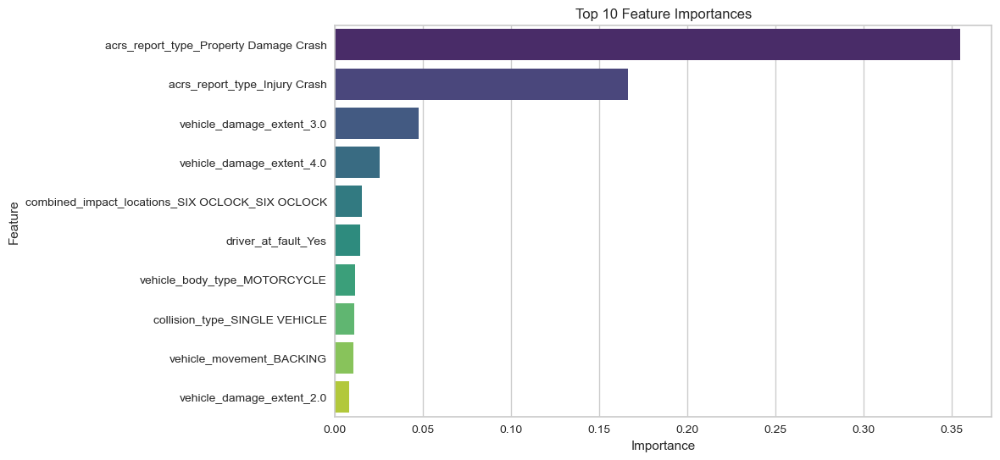

In [95]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X_train.columns)
feature_names = X_train_scaled_df.columns
feature_importance_df = pd.DataFrame({
    'Feature': feature_names[top_feature_indices],
    'Importance': feature_importances[top_feature_indices]
})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df, palette='viridis')
plt.title('Top 10 Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()


[0]	validation_0-mlogloss:1.42874
[1]	validation_0-mlogloss:1.28833
[2]	validation_0-mlogloss:1.17414
[3]	validation_0-mlogloss:1.07876
[4]	validation_0-mlogloss:0.99760
[5]	validation_0-mlogloss:0.92770
[6]	validation_0-mlogloss:0.86700
[7]	validation_0-mlogloss:0.81381
[8]	validation_0-mlogloss:0.76696
[9]	validation_0-mlogloss:0.72555
[10]	validation_0-mlogloss:0.68878
[11]	validation_0-mlogloss:0.65605
[12]	validation_0-mlogloss:0.62686
[13]	validation_0-mlogloss:0.60074
[14]	validation_0-mlogloss:0.57733
[15]	validation_0-mlogloss:0.55634
[16]	validation_0-mlogloss:0.53744
[17]	validation_0-mlogloss:0.52045
[18]	validation_0-mlogloss:0.50513
[19]	validation_0-mlogloss:0.49133
[20]	validation_0-mlogloss:0.47886
[21]	validation_0-mlogloss:0.46759
[22]	validation_0-mlogloss:0.45739
[23]	validation_0-mlogloss:0.44818
[24]	validation_0-mlogloss:0.43983
[25]	validation_0-mlogloss:0.43227
[26]	validation_0-mlogloss:0.42539
[27]	validation_0-mlogloss:0.41916
[28]	validation_0-mlogloss:0.4

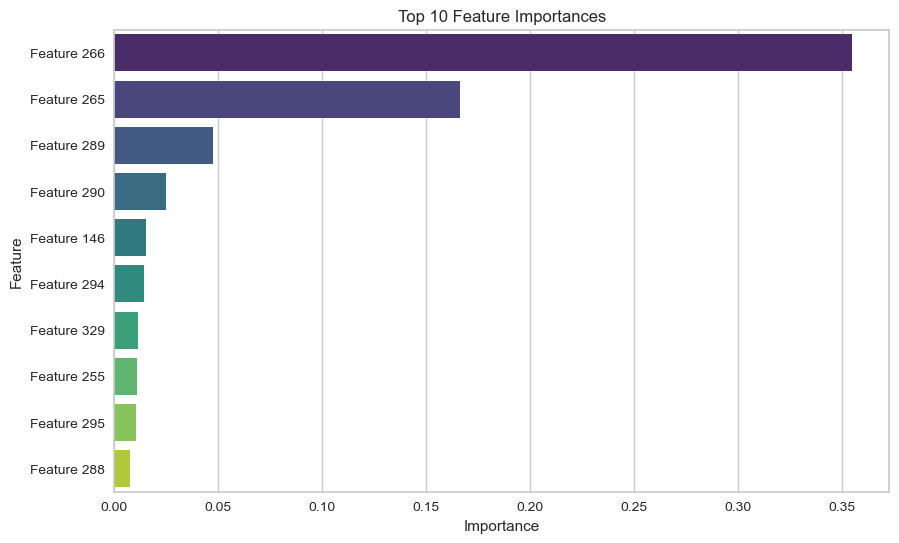

In [103]:
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
import seaborn as sns


feature_importances = best_xgb_model3.feature_importances_
top_feature_indices = feature_importances.argsort()[-10:][::-1]

X_train_top10 = X_train_scaled[:, top_feature_indices]
X_test_top10 = X_test_scaled[:, top_feature_indices]
xgb_model_top10 = XGBClassifier(
    random_state=42,
    **best_params_xgb,
    eval_metric="mlogloss"
)
eval_set_top10 = [(X_test_top10, y_test)]
xgb_model_top10.fit(
    X_train_top10, y_train,
    early_stopping_rounds=10,
    eval_set=eval_set_top10,
    verbose=True
)
y_train_pred_xgb_top10 = xgb_model_top10.predict(X_train_top10)
y_test_pred_xgb_top10 = xgb_model_top10.predict(X_test_top10)
print("Classification Report - Train Set (XGBoost - Top 10 Features):")
print(classification_report(y_train, y_train_pred_xgb_top10))

print("Classification Report - Test Set (XGBoost - Top 10 Features):")
print(classification_report(y_test, y_test_pred_xgb_top10))
feature_names = [f'Feature {i}' for i in top_feature_indices]
feature_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importances[top_feature_indices]
})

feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df, palette='viridis')
plt.title('Top 10 Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()


**10)NEURAL NETWORKS WITH GRIDSEARCH**

In [142]:
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.preprocessing import StandardScaler
import time

param_grid_nn = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50)],
    'activation': ['relu', 'tanh'],
    'alpha': [0.0001, 0.001, 0.01],
}

start_time = time.time()
nn_model = MLPClassifier(random_state=42, max_iter=200)


grid_search_nn = GridSearchCV(estimator=nn_model, param_grid=param_grid_nn, scoring='f1_macro', cv=5, verbose=2, n_jobs=-1)
grid_search_nn.fit(X_train_scaled, y_train)

best_params_nn = grid_search_nn.best_params_
best_nn_model = MLPClassifier(random_state=42, max_iter=200, **best_params_nn)
best_nn_model.fit(X_train_scaled, y_train)

y_train_pred_nn = best_nn_model.predict(X_train_scaled)

y_test_pred_nn = best_nn_model.predict(X_test_scaled)
print("Classification Report - Train Set (Neural Network):")
print(classification_report(y_train, y_train_pred_nn))
print("Classification Report - Test Set (Neural Network):")
print(classification_report(y_test, y_test_pred_nn))

end_time = time.time()

training_time_nn = end_time - start_time
print(f"Training time for Neural Network: {training_time_nn:.2f} seconds")


Fitting 5 folds for each of 18 candidates, totalling 90 fits


/Users/dikshitha/anaconda3/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator MLPClassifier from version 1.3.0 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/Users/dikshitha/anaconda3/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator MLPClassifier from version 1.3.0 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/Users/dikshitha/anaconda3/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator MLPClassifier from version 1.3.0 when using versio

Classification Report - Train Set (Neural Network):
              precision    recall  f1-score   support

           0       0.93      0.97      0.95     94551
           1       0.58      0.57      0.57     11997
           2       0.59      0.39      0.47      8177
           3       0.77      0.31      0.44       951
           4       0.92      0.94      0.93       104

    accuracy                           0.88    115780
   macro avg       0.76      0.64      0.67    115780
weighted avg       0.87      0.88      0.87    115780

Classification Report - Test Set (Neural Network):
              precision    recall  f1-score   support

           0       0.91      0.94      0.92     40523
           1       0.38      0.37      0.38      5142
           2       0.33      0.22      0.26      3504
           3       0.19      0.07      0.10       407
           4       0.65      0.53      0.59        45

    accuracy                           0.82     49621
   macro avg       0.49     

**11) ENSEMBLE MODEL WITH NN,RF,XGB**

In [143]:
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import classification_report
from sklearn.preprocessing import StandardScaler

ensemble_model1 = VotingClassifier(
    estimators=[
        ('nn', best_nn_model),
        ('rf', best_rf_model),
        ('xgb', best_xgb_model)
    ],
    voting='hard'  
)
ensemble_model1.fit(X_train_scaled, y_train)

y_train_pred_ensemble1 = ensemble_model1.predict(X_train_scaled)
y_test_pred_ensemble1 = ensemble_model1.predict(X_test_scaled)

print("Classification Report - Train Set (Ensemble):")
print(classification_report(y_train, y_train_pred_ensemble1))
print("Classification Report - Test Set (Ensemble):")
print(classification_report(y_test, y_test_pred_ensemble1))


Classification Report - Train Set (Ensemble):
              precision    recall  f1-score   support

           0       0.95      0.97      0.96     94551
           1       0.68      0.74      0.70     11997
           2       0.80      0.54      0.64      8177
           3       0.88      0.54      0.67       951
           4       0.87      0.98      0.92       104

    accuracy                           0.91    115780
   macro avg       0.83      0.75      0.78    115780
weighted avg       0.91      0.91      0.91    115780

Classification Report - Test Set (Ensemble):
              precision    recall  f1-score   support

           0       0.91      0.94      0.93     40523
           1       0.41      0.45      0.43      5142
           2       0.37      0.22      0.28      3504
           3       0.27      0.11      0.16       407
           4       0.82      0.82      0.82        45

    accuracy                           0.83     49621
   macro avg       0.56      0.51      0

**RESULTS**

Lets create a dataframe which shows results of all models used and compare them

In [198]:

# Logistic Regression Model
y_train_pred_logreg = logreg_model.predict(X_train_scaled)
y_test_pred_logreg = logreg_model.predict(X_test_scaled)

report_train_logreg = classification_report(y_train, y_train_pred_logreg, output_dict=True)
report_test_logreg = classification_report(y_test, y_test_pred_logreg, output_dict=True)

# XGBoost Model
y_pred_train_xgb = xgb_model.predict(X_train_scaled)
y_pred_test_xgb = xgb_model.predict(X_test_scaled)

report_xgb_train = classification_report(y_train, y_pred_train_xgb, output_dict=True)
report_xgb_test = classification_report(y_test, y_pred_test_xgb, output_dict=True)

# XGBoost Model WITH GRIDSEARCH
y_train_pred_xgb = best_xgb_model.predict(X_train_scaled)
y_test_pred_xgb = best_xgb_model.predict(X_test_scaled)

report_train_xgb = classification_report(y_train, y_train_pred_xgb, output_dict=True)
report_test_xgb = classification_report(y_test, y_test_pred_xgb, output_dict=True)

# Random Forest Model
y_train_rf_pred = clf.predict(X_train_scaled)
y_test_rf_pred = clf.predict(X_test_scaled)

report_rf_train = classification_report(y_train, y_train_rf_pred, output_dict=True)
report_rf_test = classification_report(y_test, y_test_rf_pred, output_dict=True)

# Random Forest Model with GRIDSEARCH
y_train_pred_rf = best_rf_model.predict(X_train_scaled)
y_test_pred_rf = best_rf_model.predict(X_test_scaled)

report_train_rf = classification_report(y_train, y_train_pred_rf, output_dict=True)
report_test_rf = classification_report(y_test, y_test_pred_rf, output_dict=True)

# AdaBoost Model
y_train_pred_adaboost = adaboost_model.predict(X_train_scaled)
y_test_pred_adaboost = adaboost_model.predict(X_test_scaled)

report_train_adaboost = classification_report(y_train, y_train_pred_adaboost, output_dict=True)
report_test_adaboost = classification_report(y_test, y_test_pred_adaboost, output_dict=True)

#Gradient Boosting

y_train_pred_gb = gb_model.predict(X_train_scaled)
y_test_pred_gb = gb_model.predict(X_test_scaled)

report_train_gb = classification_report(y_train, y_train_pred_gb, output_dict=True)
report_test_gb = classification_report(y_test, y_test_pred_gb, output_dict=True)


#Neural Networks

y_train_pred_nn = best_nn_model.predict(X_train_scaled)
y_test_pred_nn = best_nn_model.predict(X_test_scaled)

report_train_nn = classification_report(y_train, y_train_pred_nn, output_dict=True)
report_test_nn = classification_report(y_test, y_test_pred_nn, output_dict=True)


#Ensemble_model with RF,GB


y_train_pred_em = ensemble_model.predict(X_train_scaled)
y_test_pred_em = ensemble_model.predict(X_test_scaled)

report_train_em = classification_report(y_train, y_train_pred_em, output_dict=True)
report_test_em = classification_report(y_test, y_test_pred_em, output_dict=True)

#Ensemble_model with NN,RF,XGB


y_train_pred_em1 = ensemble_model1.predict(X_train_scaled)
y_test_pred_em1 = ensemble_model1.predict(X_test_scaled)

report_train_em1 = classification_report(y_train, y_train_pred_em1, output_dict=True)
report_test_em1 = classification_report(y_test, y_test_pred_em1, output_dict=True)


df_train_logreg = classification_report_to_df(report_train_logreg, prefix='Logistic Regression')
df_test_logreg = classification_report_to_df(report_test_logreg, prefix='Logistic Regression')

df_xgb_train = classification_report_to_df(report_xgb_train, prefix='XGB')
df_xgb_test = classification_report_to_df(report_xgb_test, prefix='XGB')

df_train_xgb = classification_report_to_df(report_train_xgb, prefix='XGB (With Grid SearchCV)')
df_test_xgb = classification_report_to_df(report_test_xgb, prefix='XGB ((With Grid SearchCV)')

df_rf_train = classification_report_to_df(report_rf_train, prefix='Random Forest')
df_rf_test = classification_report_to_df(report_rf_test, prefix='Random Forest')

df_train_rf = classification_report_to_df(report_train_rf, prefix='Random Forest (With Grid SearchCV)')
df_test_rf = classification_report_to_df(report_test_rf, prefix='Random Forest (With Grid SearchCV)')

df_train_adaboost = classification_report_to_df(report_train_adaboost, prefix='AdaBoost')
df_test_adaboost = classification_report_to_df(report_test_adaboost, prefix='AdaBoost')


df_train_gb = classification_report_to_df(report_train_gb, prefix='Gradient Boosting')
df_test_gb = classification_report_to_df(report_test_gb, prefix='Gradient Boosting')

df_train_nn = classification_report_to_df(report_train_nn, prefix='Neural Networks (With Grid SearchCV)')
df_test_nn = classification_report_to_df(report_test_nn, prefix='Neural Networks (With Grid SearchCV)')

df_train_em = classification_report_to_df(report_train_em, prefix='Ensemble (RF+GB)')
df_test_em = classification_report_to_df(report_test_em, prefix='Ensemble (RF+GB)')

df_train_em1 = classification_report_to_df(report_train_em1, prefix='Ensemble(NN+RF+XG)')
df_test_em1 = classification_report_to_df(report_test_em1, prefix='Ensemble (NN+RF+XG)')

#concatenating them to create a dataframe
result_train = pd.concat([df_train_logreg, df_xgb_train, df_train_xgb, df_rf_train, df_train_rf, df_train_adaboost,df_train_gb,df_train_nn,df_train_em,df_train_em1])
result_test = pd.concat([df_test_logreg, df_xgb_test, df_test_xgb, df_rf_test, df_test_rf, df_test_adaboost,df_test_gb,df_test_nn,df_test_em,df_test_em1])




In [199]:
result_train

,F1 Score - Class 0,F1 Score - Class 1,F1 Score - Class 2,F1 Score - Class 3,F1 Score - Class 4
Logistic Regression,0.928519,0.402186,0.227014,0.159858,0.884956
XGB,0.941685,0.553346,0.439818,0.509174,1.000000
XGB (With Grid SearchCV),0.956904,0.704788,0.646234,0.629261,0.917431
Random Forest,0.999984,0.999875,1.000000,1.000000,1.000000
Random Forest (With Grid SearchCV),0.894983,0.520448,0.524338,0.384297,0.873950
AdaBoost,0.909021,0.205855,0.145865,0.133625,0.681034
Gradient Boosting,0.927758,0.386476,0.249376,0.187037,0.825000
Neural Networks (With Grid SearchCV),0.950438,0.572838,0.465590,0.444611,0.933333
Ensemble (RF+GB),0.927754,0.398356,0.253220,0.207149,0.880000
Ensemble(NN+RF+XG),0.958173,0.704923,0.640456,0.669271,0.923077


In [200]:
result_test


,F1 Score - Class 0,F1 Score - Class 1,F1 Score - Class 2,F1 Score - Class 3,F1 Score - Class 4
Logistic Regression,0.928205,0.372839,0.220811,0.122047,0.765957
XGB,0.929492,0.400571,0.261122,0.118774,0.853933
XGB ((With Grid SearchCV),0.929714,0.405209,0.277013,0.125737,0.863636
Random Forest,0.921258,0.338916,0.199343,0.068966,0.269231
Random Forest (With Grid SearchCV),0.891772,0.411819,0.317722,0.198574,0.765957
AdaBoost,0.909249,0.193122,0.141689,0.125490,0.686869
Gradient Boosting,0.927630,0.372160,0.255695,0.086768,0.760000
Neural Networks (With Grid SearchCV),0.924715,0.377651,0.263635,0.098540,0.585366
Ensemble (RF+GB),0.927548,0.373128,0.248808,0.095445,0.764045
Ensemble (NN+RF+XG),0.927397,0.425721,0.277150,0.156250,0.822222


**From above results we can see Random Forest with Grid Search CV provides us the best results**

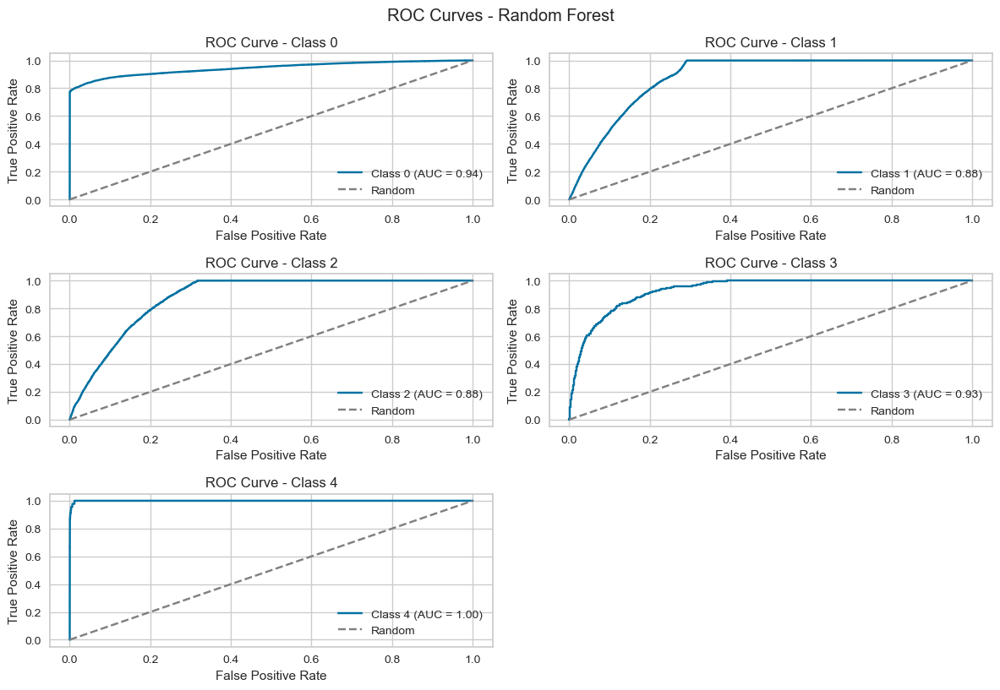

In [169]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np

def plot_roc_curves_multiclass(y_true, y_probs, model_name):
    n_classes = y_probs.shape[1]
    fig, axes = plt.subplots(nrows=min(5, int(np.ceil(n_classes/2))), ncols=2, figsize=(12, 8))
    axes = axes.flatten()

    for i in range(min(5, n_classes)): 
        fpr, tpr, _ = roc_curve(y_true == i, y_probs[:, i])
        roc_auc = auc(fpr, tpr)

        ax = axes[i]
        ax.plot(fpr, tpr, label=f'Class {i} (AUC = {roc_auc:.2f})')
        ax.plot([0, 1], [0, 1], linestyle='--', color='grey', label='Random')
        ax.set_xlabel('False Positive Rate')
        ax.set_ylabel('True Positive Rate')
        ax.set_title(f'ROC Curve - Class {i}')
        ax.legend(loc='lower right')

    for j in range(n_classes, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.suptitle(f'ROC Curves - {model_name}', y=1.02)
    plt.show()

plot_roc_curves_multiclass(y_test, best_rf_model.predict_proba(X_test_scaled), 'Random Forest')


**Learning Curve**

/Users/dikshitha/anaconda3/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator DecisionTreeClassifier from version 1.3.0 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/Users/dikshitha/anaconda3/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator RandomForestClassifier from version 1.3.0 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/Users/dikshitha/anaconda3/lib/python3.11/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator DecisionTreeClassifier from vers

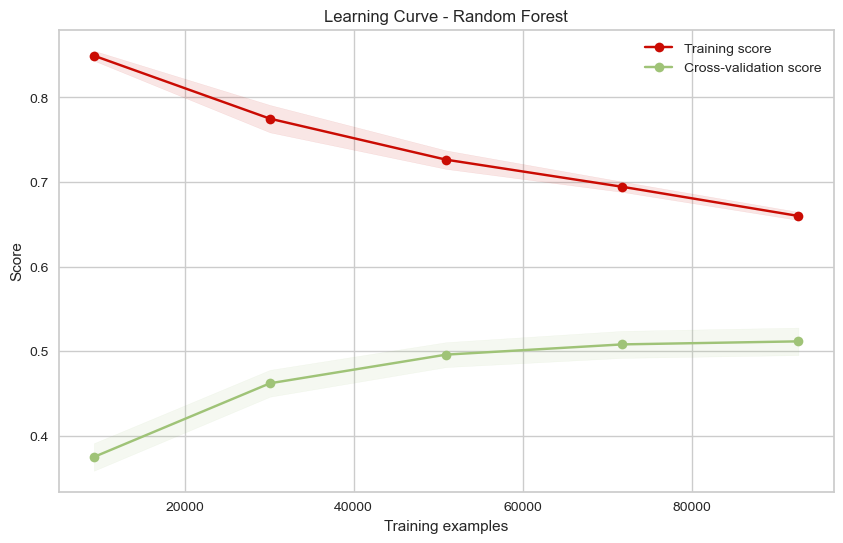

In [180]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve

def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None, n_jobs=-1, train_sizes=np.linspace(.1, 1.0, 5)):
    plt.figure(figsize=(10, 6))
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes, scoring='f1_macro'
    )
    
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

    plt.fill_between(
        train_sizes,
        train_scores_mean - train_scores_std,
        train_scores_mean + train_scores_std,
        alpha=0.1, color="r"
    )
    plt.fill_between(
        train_sizes,
        test_scores_mean - test_scores_std,
        test_scores_mean + test_scores_std,
        alpha=0.1, color="g"
    )
    
    plt.plot(
        train_sizes,
        train_scores_mean,
        'o-', color="r",
        label="Training score"
    )
    plt.plot(
        train_sizes,
        test_scores_mean,
        'o-', color="g",
        label="Cross-validation score"
    )

    plt.legend(loc="best")
    return plt

plot_learning_curve(best_rf_model, "Learning Curve - Random Forest", X_train_scaled, y_train, cv=5, n_jobs=-1)
plt.show()


**Interpretation:**

The decreasing training score might be an indication that the model is becoming less sensitive to noise in the training data, which is not necessarily a bad thing.

The increasing cross-validation score is a positive sign, as it suggests that the model is learning patterns that generalize well to new, unseen data. Since the cross-validation score is increasing, it seems that collecting more data is helping the model generalize better.

**Precision-Recall Curve**

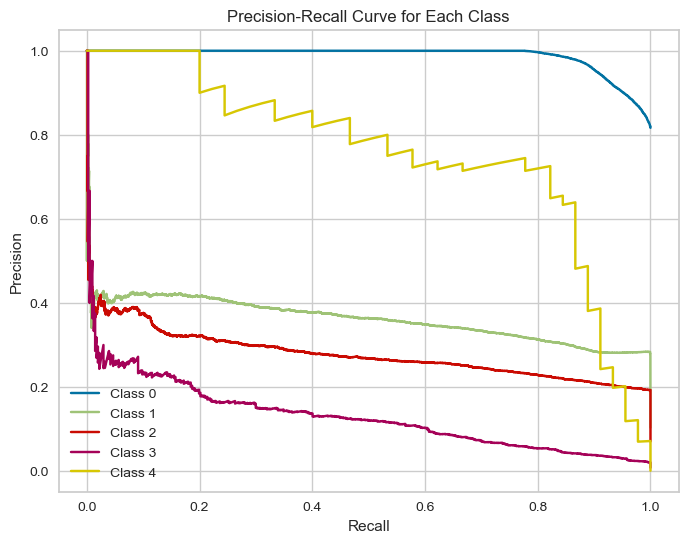

In [189]:
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt

y_probs = best_rf_model.predict_proba(X_test_scaled)
plt.figure(figsize=(8, 6))
for i in range(n_classes):  
    precision, recall, _ = precision_recall_curve(y_test == i, y_probs[:, i])
    plt.plot(recall, precision, label=f'Class {i}')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve for Each Class')
plt.legend(loc='best')
plt.show()


**Feature Importance**

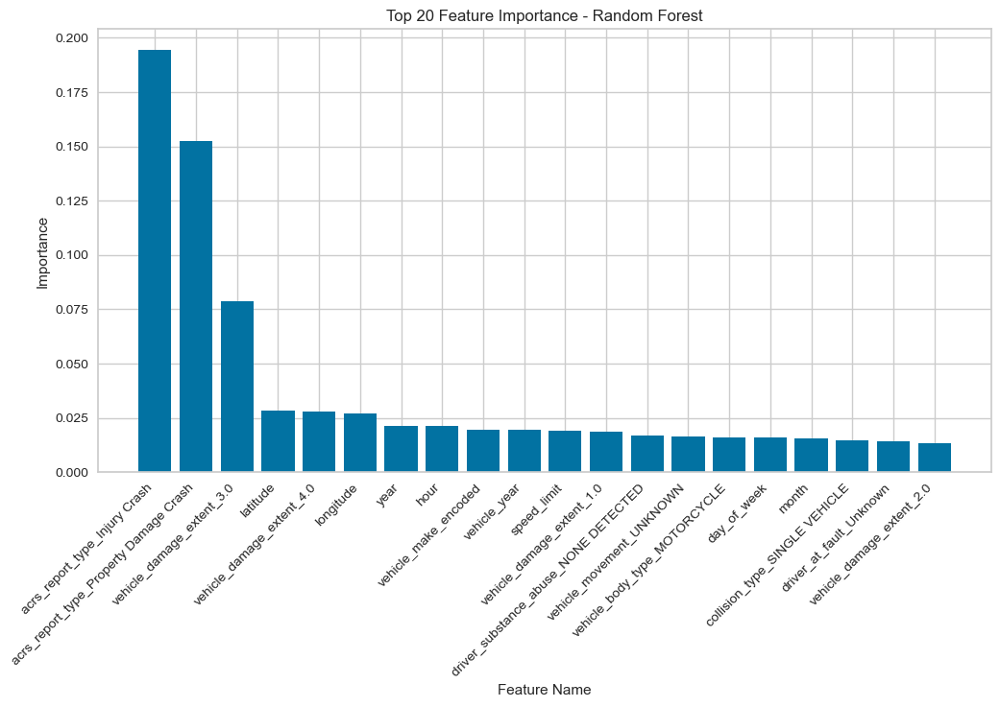

In [194]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming best_rf_model is your trained RandomForestClassifier
feature_importance = best_rf_model.feature_importances_

# Assuming X_train_scaled is a DataFrame
feature_names = X_train.columns

# Sort the feature importances in descending order
indices = np.argsort(feature_importance)[::-1][:20]  # Select the top 20 features

# Plot the top 20 feature importances with corresponding names
plt.figure(figsize=(12, 6))
plt.bar(range(len(indices)), feature_importance[indices], align="center")
plt.xticks(range(len(indices)), feature_names[indices], rotation=45, ha="right")
plt.title("Top 20 Feature Importance - Random Forest")
plt.xlabel("Feature Name")
plt.ylabel("Importance")
plt.show()


**CONFUSION MATRIX**

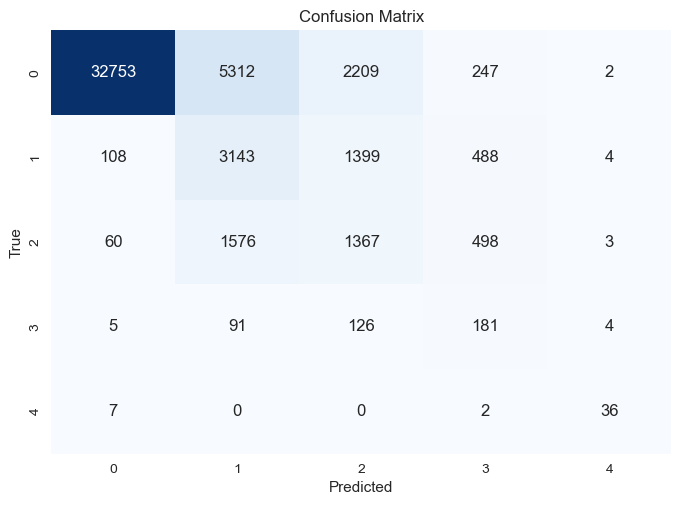

In [186]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

y_test_pred = best_rf_model.predict(X_test_scaled)

cm = confusion_matrix(y_test, y_test_pred)
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


In [190]:
y_train_pred = best_rf_model.predict(X_train_scaled)

y_test_pred = best_rf_model.predict(X_test_scaled)


print("Classification Report - Train Set:")
print(classification_report(y_train, y_train_pred))

print("Classification Report - Test Set:")
print(classification_report(y_test, y_test_pred))

Classification Report - Train Set:
              precision    recall  f1-score   support

           0       1.00      0.81      0.89     94551
           1       0.39      0.76      0.52     11997
           2       0.43      0.66      0.52      8177
           3       0.25      0.83      0.38       951
           4       0.78      1.00      0.87       104

    accuracy                           0.80    115780
   macro avg       0.57      0.81      0.64    115780
weighted avg       0.89      0.80      0.83    115780

Classification Report - Test Set:
              precision    recall  f1-score   support

           0       0.99      0.81      0.89     40523
           1       0.31      0.61      0.41      5142
           2       0.27      0.39      0.32      3504
           3       0.13      0.44      0.20       407
           4       0.73      0.80      0.77        45

    accuracy                           0.76     49621
   macro avg       0.49      0.61      0.52     49621
weighted

**Conclusions:**


THe decision not to use any sampling techniques was intentional and we aimed at ensuring integrity of our results. By relying on all algorithms built-in mechanisms and using hyperparameter tuning we acheived good results. We avoided potential biases that will be introduced by  oversampling or undersampling, allowing our model to adapt to originality of dataset.

Though the dataset which was used was highly imbalanced, but with the techniques and the methodlogies we used we got better results.

In this project we performed various operations on dataset and found that Random Forest with Hyper-Parameter Tuning performed better when compared to others.


We employed various feature-engineering techniques like Feature Extraction, Feature Scaling, Feature Encoding etc..,

If we consider f1-score of minor class XGBoost gives us best score 

We can also see that geolocation also used as top feature to predict injury_severity.

Insights gained from this project can be instrumental for traffic authorities and policy makers.



**Further Studies :**

Although we tried various Hyperparameters for training the model, we can still explore advanced hyperparameter tuning techniques to further enhance model's predictive accuracy. This involves fine-tuning our models to optimize performance.

Another area would be feature engineering. Although we made few feature engineering tasks, additional feature extraction or selection can impact models performance.

We tried running ensemble methods but investigating more ensemble methods or stacking methods would yeild a better performance.

It is also crucial to acknowlede role of sampling techniques in handling class imbalance.  While our current approach is focussed on leveraging capabilites of models without sampling, exploring impact of sampling could provide valuable insights.

This exploation can be implemented cloud based or on-premise which aims to ensure models not only perform well but are also practical and efficient in deployment scenarios.



**References**

Class Notes

https://scikit-learn.org/stable/modules/classes.html#module-sklearn.preprocessing

https://scikit-learn.org/stable/modules/grid_search.html

https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74


Feature Engineering - https://www.youtube.com/playlist?list=PLKnIA16_RmvYXWH_E6PuVLLHHTWXwwDN7